<center><h2><strong>Case Study Data Mining: Aplikasi model Klasifikasi
</strong></h2></center>

<center><h2><strong> Kelompok F </strong></h2></center>

<h3> Anggota Kelompok: </h3>

1. Yudistira Dwi Cahya (2006530942)
  - Melakukan percobaan preprocessing
  - Membuat insight dari hasil kata yang sering muncul
  - Menelaah error pada code
  - Membuat visualisasi Topic Modelling
2. Wulan Akhsah (2106637100)
  - Melakukan percobaan preprocessing
  - Membuat insight Pie Chart dan Platform Fact Check
3. Kamal Muftie Yafi (2106725034)
  - Melakukan preprocessing
  - Membuat model dan menentukan model terbaik
  - Melakukan Cross-Validation terhadap model
  - Membuat visualisasi analisis feature importance
4. Rachel Thyffani Margaretha S (2106726900)
  - Melakukan percobaan preprocessing
  - Memberikan insight melalui voyant tools
5. Vesya Padmadewi (2106726926)
  - Melakukan percobaan preprocessing
  - Memberikan visualisasi mengenai analisis perbandingan kata teratas di berita hoax dan berita non hoax
  - Memberikan penjelasan pada analisis dan insight

<center><h2><strong> Studi Kasus Data Mining: Aplikasi Model klasifikasi </strong></h2></center>

## Domain Knowledge & Data Understanding:

- Data dibawah ini adalah data Hoax dari https://www.mafindo.or.id/ yang didapatkan secara **legal** dengan meminta izin kepada pimpinan perusahaan Mafindo.
- Label "0" menyatakan **bukan Hoax** dan "1" menyatakan post **Hoax**.

## Tugas Anda:
- Lakukan PreProcessing pada variabel "teks" di data.
- Lalukan EDA pada data Hoax tersebut.
- Buat **Model klasifikasi Hoax** terbaik dengan **parameter optimal** (dan **cross validated**)
- Buatlah sebuah **laporan Analisa Data** tersebut (di Jupyter Notebook) seolah-olah anda adalah seorang Data Scientist Kominfo dan ditugaskan oleh menteri-nya untuk menjelaskan tentang data Hoax yang ada.
- Jangan lupa jika anda akan melakukan attach gambar (misal screenshot dari *Voyant Tools*) maka **jangan load local file**, tapi upload terlebih dahulu ke GitHub (kalian sendiri) lalu load di Jupyter Notebook.
- Cara load image dengan markdown saat gambar ada di GitHub: https://stackoverflow.com/a/63270255/2844866
- Ingat jangan load local image(s) karena dosen tidak akan bisa membukanya.
- Teknik preprocessing, slicing data, variabel selection & engineering, pemilihan visualisasi, interpretasi, Performa model klasifikasi, dan penyajian report adalah hal-hal yang akan dinilai dari kasus ini.
- Code harus bisa di "Run-All" di **Google Colab**, "Error Free", dan **TIDAK PERLU REQUEST ACCESS** (bisa dibuka oleh umum/public).

## Pengumpulan Studi Kasus:
- Jawaban dikirimkan via email dengan deadline submission Kamis, 23 November 2023 Jam 18:00 WIB
  - email: taufik.sutanto@sci.ui.ac.id
  - Subject: "Studi Kasus Model klasifikasi Ganjil 2023 - Kelompok XYZ"
  - Isi eMail:
    - Nama Lengkap & NIM seluruh Anggota
    - Link ke Google Colab
  - File ipynb di **attach/lampirkan** di email dengan nama file : **Kasus-Klasifikasi-Kelompok-XYZ.ipynb**
- Pengerjaan dapat dilakukan sejak diterimanya file ini.
- **Periksa "sent folder"** setelah mengirimkan jawaban, yakinkan email terkirim dengan baik & attachment tidak terlupa.

## *Import library/packages & data*

### *Import modules*

In [ ]:
!pip install emoji --upgrade
!pip install unidecode
!pip install PySastrawi

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 358.9/358.9 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.5/235.5 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 210.6/210.6 kB 2.7 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import os
import pickle

#Text cleaning
import re, string
import emoji
import unicodedata

import warnings; warnings.simplefilter('ignore')
import nltk
from unidecode import unidecode
from html import unescape

### Import *csv* data

In [ ]:
# Loading Data
import warnings; warnings.simplefilter('ignore')
import pandas as pd

fData = 'data/Data-Hoax-Mafindo.csv'
try:
    data = pd.read_csv(fData)
except:
    !mkdir data
    !wget -P data/ https://raw.githubusercontent.com/taudataanalytics/taudata-Academy/master/data/Data-Hoax-Mafindo.csv
    data = pd.read_csv(fData)

data.head()

--2023-11-24 16:14:59--  https://raw.githubusercontent.com/taudataanalytics/taudata-Academy/master/data/Data-Hoax-Mafindo.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.108.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1279335 (1.2M) [text/plain]
Saving to: ‘data/Data-Hoax-Mafindo.csv’

Data-Hoax-Mafindo.c 100%[===================>]   1.22M  --.-KB/s    in 0.01s   

2023-11-24 16:14:59 (106 MB/s) - ‘data/Data-Hoax-Mafindo.csv’ saved [1279335/1279335]



,ID,label,tanggal,judul,narasi,nama file gambar
0,71,1,17-Aug-20,Pemakaian Masker Menyebabkan Penyakit Legionna...,A caller to a radio talk show recently shared ...,71.jpg
1,461,1,17-Jul-20,Instruksi Gubernur Jateng tentang penilangan ...,Yth.Seluruh Anggota Grup Sesuai Instruksi Gube...,461.png
2,495,1,13-Jul-20,Foto Jim Rohn: Jokowi adalah presiden terbaik ...,Jokowi adalah presiden terbaik dlm sejarah ban...,495.png
3,550,1,8-Jul-20,"ini bukan politik, tapi kenyataan Pak Jokowi b...","Maaf Mas2 dan Mbak2, ini bukan politik, tapi k...",550.png
4,681,1,24-Jun-20,Foto Kadrun kalo lihat foto ini panas dingin,Kadrun kalo lihat foto ini panas dingin . .,681.jpg


In [ ]:
data.tail()

,ID,label,tanggal,judul,narasi,nama file gambar
4696,988471,0,27-Jun-18,Banser-PDIP Berdamai,Ratusan massa dari Barisan Serba Guna (Banser)...,988471.png
4697,991611,1,23-Jul-20,ERDOGAN TAK MAU DUDUK DI KURSI TAMU YANG LEBIH...,ERDOGAN DATANG KE VATIKAN MENJUMPAI BABA (POP)...,991611.png
4698,992733,1,1-Apr-20,"Imigran China Sengaja Membawa Virus, Tujuannya...",IMIGRAN CN SENGAJA MEMBAWA VIRUS DAN MEREKA TE...,992733.jpg
4699,995077,1,5-Mar-19,BUKTI KECURANGAN JOKOWI BAGI SEMBAKO,Beredar dimana mana jadi VIRAL video ini\nApa ...,995077.png
4700,995120,1,24-Feb-19,Anak Kecil Bersembunyi di Kolong Meja Saat Ber...,Naluri Anak Kecil Itu Tajam Boooss……..\n Saat ...,995120.png


## *Pre-processing*

### Hitung distribusi masing-masing label

In [ ]:
data['label'].value_counts()

1    3850
0     851
Name: label, dtype: int64

<Axes: xlabel='label', ylabel='count'>

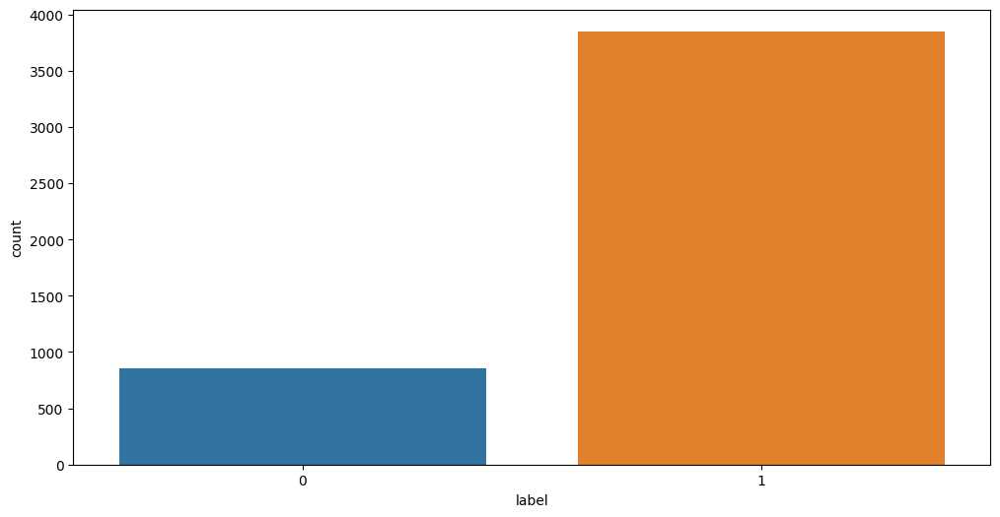

In [ ]:
plt.figure(figsize = (12, 6))
sns.countplot(x = 'label', data = data)

Berdasarkan hasil `value_counts()` dan visualisasi di atas, terdapat 3850 data hoax dan 851 data bukan hoax.

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4701 entries, 0 to 4700
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   ID                4701 non-null   int64 
 1   label             4701 non-null   int64 
 2   tanggal           4701 non-null   object
 3   judul             4701 non-null   object
 4   narasi            4701 non-null   object
 5   nama file gambar  4701 non-null   object
dtypes: int64(2), object(4)
memory usage: 220.5+ KB


### Check NaN / isna / isnull

In [ ]:
data.isna().sum()

ID                  0
label               0
tanggal             0
judul               0
narasi              0
nama file gambar    0
dtype: int64

Berdasarkan hasil di atas, tidak terdapat data kosong/NA/null

In [ ]:
data['judul'].to_csv('/content/judul.csv', encoding='utf-8', index=False)

### Deep cleaning

#### Bentuk fungsi untuk cleaning

In [ ]:
#remove unichar like emoji in utf-8
unichar = pd.read_csv("https://raw.githubusercontent.com/kmyafi/Emotion-Analysis/main/utf8_char.csv", sep='\t', header = None)
unichar_values = unichar[2].values
def remove_unichar_emoji(text):
    for i in unichar_values:
        text = text.replace(str(i), " ")
    return text

#Clean emojis from text
def strip_emoji(text):
    try:
        text = text.encode('latin1').decode('unicode-escape').encode('latin1').decode('utf8')
    except:
        pass
    #return re.sub(emoji.get_emoji_regexp(), r"", text) #remove emoji
    return emoji.replace_emoji(text, replace=' ')

# remove semua karakter terkait html: unescape html eg.   & | link/url | tag html
import html
def remove_html(text):
    text = html.unescape(text)
    tag_pattern = re.compile(r'<.*?>')
    text = tag_pattern.sub(r'',text)
    regex_str = r'(https?:\/\/(?:www\.|(?!www))[a-zA-Z0-9][a-zA-Z0-9-]+[a-zA-Z0-9]\.[^\s]{2,}|www\.[a-zA-Z0-9][a-zA-Z0-9-]+[a-zA-Z0-9]\.[^\s]{2,}|https?:\/\/(?:www\.|(?!www))[a-zA-Z0-9]+\.[^\s]{2,}|www\.[a-zA-Z0-9]+\.[^\s]{2,})'
    url_pattern = re.compile(regex_str)
    text = url_pattern.sub(r'', text)
    return text

# Fungsi untuk replace Accented Characters (Non-ASCII) dengan yg equivalen
def remove_accented_chars(text):
    text = unicodedata.normalize('NFKD', text).encode('ascii', 'ignore').decode('utf-8', 'ignore')
    return text

#Remove punctuations, links, mentions and \r\n new line characters
def strip_all_entities(text):
    text = text.lower()
    text = re.sub(r'(\w)(\1{2,})', r"\1", text) # will replace repeated char
    text = text.replace('\r', ' ').replace('\n', ' ') #remove \n and \r
    text = re.sub(r"\S*@\S*\s?", " ", text) #remove email
    text = re.sub(r"(?:\@|https?\://)\S+", "", text) #remove links and mentions
    text = re.sub(r'[^\x00-\x7f]',r' ', text) #remove non utf8/ascii characters such as '\x9a\x91\x97\x9a\x97'
    text = text.translate(text.maketrans(string.punctuation, ' '*len(string.punctuation)))
    text = ' '.join(word for word in text.split() if not word.isnumeric()) #remove word only number
    text = re.sub(r'\b\w\b', "", text) #remove one letter only
    text = re.sub("(username|user|url|rt)\s|\s(user|url|rt)","",text)
    text = ' '.join(word for word in text.split() if len(word) < 21) # remove words longer than 21 characters
    text = ' '.join(word for word in text.split() if len(word) > 1) # remove words contain single letter only
    return text

#Remove multiple sequential spaces
def remove_mult_spaces(text):
    return re.sub("\s\s+" , " ", text)

kamus_alay1 = pd.read_csv('https://raw.githubusercontent.com/kmyafi/Emotion-Analysis/main/new_kamusalay.csv', encoding='CP1252', dtype = str, names=['alay', 'formal'])
kamus_alay1 = kamus_alay1.drop_duplicates(subset=['alay'], keep='first')
kamus_alay1 = kamus_alay1.set_index('alay')

def clean_alay(text):
    text_split = text.split(' ') #normalisasi
    for i in range(len(text_split)):
        if text_split[i] in kamus_alay1.index:
            text_split[i] = kamus_alay1.loc[text_split[i]]['formal']
    result = ' '.join(map(str, text_split))
    ######hilangkan lagi angka yg muncul
    result = ' '.join(word for word in result.split() if not word.isnumeric())
    return result

#Aplikasikan seluruh functions sesuai urutan
def clean_normalize(text):
    text = remove_unichar_emoji(text)
    text = strip_emoji(text)
    text = remove_html(text)
    text = remove_accented_chars(text)
    text = strip_all_entities(text)
    text = remove_mult_spaces(text)
    text = clean_alay(text)
    return text

In [ ]:
# melakukan pembersihan data
def clean_text(text):   # fungsi membersihkan teks
    text = unescape(text) # decoding/mengubah kode simbol menjadi simbol
    text = unidecode(text)  # encoding/mengubah simbol menjadi kata

    getHashtags = re.compile(r"#(\w+)")
    pisahtags = re.compile(r'[A-Z][^A-Z]*')
    tagS = re.findall(getHashtags, text)
    for tag in tagS:
        proper_words = ' '.join(re.findall(pisahtags, tag))
        text = text.replace('#'+tag,proper_words) #mengganti hashtag jadi kata dasarnya
    #text = str(text).lower()   # menjadikan teks huruf nonkapital
    return text

#### Judul

Akan dilakukan pembersihan terhadap variabel/kolom judul

In [ ]:
judul_new = data['judul'].values
judul_new

array(['Pemakaian Masker Menyebabkan Penyakit Legionnaires',
       'Instruksi Gubernur Jateng tentang penilangan  bagi yg tidak bermasker di muka umum Rp.150.000 menggunakan e-tilang Via apps PIKOBAR',
       'Foto Jim Rohn: Jokowi adalah presiden terbaik dlm sejarah bangsa Indonesia',
       ...,
       'Imigran China Sengaja Membawa Virus, Tujuannya Membasmi Rakyat +62',
       'BUKTI KECURANGAN JOKOWI BAGI SEMBAKO',
       'Anak Kecil Bersembunyi di Kolong Meja Saat Bertemu Presiden Joko Widodo'],
      dtype=object)

##### Lakukan pembersihan

In [ ]:
judul_temporary = []
for t in judul_new:
    judul_temporary.append(clean_text(t))
judul_new = judul_temporary
judul_new

['Pemakaian Masker Menyebabkan Penyakit Legionnaires',
 'Instruksi Gubernur Jateng tentang penilangan  bagi yg tidak bermasker di muka umum Rp.150.000 menggunakan e-tilang Via apps PIKOBAR',
 'Foto Jim Rohn: Jokowi adalah presiden terbaik dlm sejarah bangsa Indonesia',
 'ini bukan politik, tapi kenyataan Pak Jokowi berhasil memulangkan 11,000 Triliun uang negara dari Swiss.',
 'Foto Kadrun kalo lihat foto ini panas dingin',
 'event promo smartphone JNE 2020 spesial di bulan juni',
 'MEREKA SUDAH MEMPERSIAPKAN DIRI DENGAN BAIK UNTUK MENGUASAI NEGRI INI!',
 'Foto Presiden Italia menangis karena tak cukup lahan untuk mengubur 700an korban corona per hari',
 'Kapolres Timor Tengah Utara , Nusa Tenggara Timur  Beri Klarifikasi Terkait Video Polisi Diamkan Korban Kecelakaan',
 'Video Polisi china telah menganiaya wanita uighur lehernya di cekik pake kaki',
 'Akhirnya, Jokowi bersedia mengundurkan diri',
 'Info Jalur Rawan Begal dan Himbauan Untuk Tidak Keluar Malam Oleh Kapolres Cianjur',
 '

In [ ]:
judul_temporary = []
for t in judul_new:
    judul_temporary.append(remove_html(t))
judul_new = judul_temporary
judul_new

['Pemakaian Masker Menyebabkan Penyakit Legionnaires',
 'Instruksi Gubernur Jateng tentang penilangan  bagi yg tidak bermasker di muka umum Rp.150.000 menggunakan e-tilang Via apps PIKOBAR',
 'Foto Jim Rohn: Jokowi adalah presiden terbaik dlm sejarah bangsa Indonesia',
 'ini bukan politik, tapi kenyataan Pak Jokowi berhasil memulangkan 11,000 Triliun uang negara dari Swiss.',
 'Foto Kadrun kalo lihat foto ini panas dingin',
 'event promo smartphone JNE 2020 spesial di bulan juni',
 'MEREKA SUDAH MEMPERSIAPKAN DIRI DENGAN BAIK UNTUK MENGUASAI NEGRI INI!',
 'Foto Presiden Italia menangis karena tak cukup lahan untuk mengubur 700an korban corona per hari',
 'Kapolres Timor Tengah Utara , Nusa Tenggara Timur  Beri Klarifikasi Terkait Video Polisi Diamkan Korban Kecelakaan',
 'Video Polisi china telah menganiaya wanita uighur lehernya di cekik pake kaki',
 'Akhirnya, Jokowi bersedia mengundurkan diri',
 'Info Jalur Rawan Begal dan Himbauan Untuk Tidak Keluar Malam Oleh Kapolres Cianjur',
 '

In [ ]:
judul_temporary = []
for t in judul_new:
    judul_temporary.append(remove_accented_chars(t))
judul_new = judul_temporary
judul_new

['Pemakaian Masker Menyebabkan Penyakit Legionnaires',
 'Instruksi Gubernur Jateng tentang penilangan  bagi yg tidak bermasker di muka umum Rp.150.000 menggunakan e-tilang Via apps PIKOBAR',
 'Foto Jim Rohn: Jokowi adalah presiden terbaik dlm sejarah bangsa Indonesia',
 'ini bukan politik, tapi kenyataan Pak Jokowi berhasil memulangkan 11,000 Triliun uang negara dari Swiss.',
 'Foto Kadrun kalo lihat foto ini panas dingin',
 'event promo smartphone JNE 2020 spesial di bulan juni',
 'MEREKA SUDAH MEMPERSIAPKAN DIRI DENGAN BAIK UNTUK MENGUASAI NEGRI INI!',
 'Foto Presiden Italia menangis karena tak cukup lahan untuk mengubur 700an korban corona per hari',
 'Kapolres Timor Tengah Utara , Nusa Tenggara Timur  Beri Klarifikasi Terkait Video Polisi Diamkan Korban Kecelakaan',
 'Video Polisi china telah menganiaya wanita uighur lehernya di cekik pake kaki',
 'Akhirnya, Jokowi bersedia mengundurkan diri',
 'Info Jalur Rawan Begal dan Himbauan Untuk Tidak Keluar Malam Oleh Kapolres Cianjur',
 '

In [ ]:
judul_temporary = []
for t in judul_new:
    judul_temporary.append(strip_all_entities(t))
judul_new = judul_temporary
judul_new

['pemakaian masker menyebabkan penyakit legionnaires',
 'instruksi gubernur jateng tentang penilangan bagi yg tidak bermasker di muka umum rp menggunakan tilang via apps pikobar',
 'foto jim rohn jokowi adalah presiden terbaik dlm sejarah bangsa indonesia',
 'ini bukan politik tapi kenyataan pak jokowi berhasil memulangkan triliun uang negara dari swiss',
 'foto kadrun kalo lihat foto ini panas dingin',
 'event promo smartphone jne spesial di bulan juni',
 'mereka sudah mempersiapkan diri dengan baik untuk menguasai negri ini',
 'foto presiden italia menangis karena tak cukup lahan untuk mengubur 700an korban corona per hari',
 'kapolres timor tengah utara nusa tenggara timur beri klarifikasi terkait video polisi diamkan korban kecelakaan',
 'video polisi china telah menganiaya wanita uighur lehernya di cekik pake kaki',
 'akhirnya jokowi bersedia mengundurkan diri',
 'info jalur rawan begal dan himbauan untuk tidak keluar malam oleh kapolres cianjur',
 'dirut pt agung podomoro land co

In [ ]:
judul_temporary = []
for t in judul_new:
    judul_temporary.append(remove_mult_spaces(t))
judul_new = judul_temporary
judul_new

['pemakaian masker menyebabkan penyakit legionnaires',
 'instruksi gubernur jateng tentang penilangan bagi yg tidak bermasker di muka umum rp menggunakan tilang via apps pikobar',
 'foto jim rohn jokowi adalah presiden terbaik dlm sejarah bangsa indonesia',
 'ini bukan politik tapi kenyataan pak jokowi berhasil memulangkan triliun uang negara dari swiss',
 'foto kadrun kalo lihat foto ini panas dingin',
 'event promo smartphone jne spesial di bulan juni',
 'mereka sudah mempersiapkan diri dengan baik untuk menguasai negri ini',
 'foto presiden italia menangis karena tak cukup lahan untuk mengubur 700an korban corona per hari',
 'kapolres timor tengah utara nusa tenggara timur beri klarifikasi terkait video polisi diamkan korban kecelakaan',
 'video polisi china telah menganiaya wanita uighur lehernya di cekik pake kaki',
 'akhirnya jokowi bersedia mengundurkan diri',
 'info jalur rawan begal dan himbauan untuk tidak keluar malam oleh kapolres cianjur',
 'dirut pt agung podomoro land co

In [ ]:
judul_temporary = []
for t in judul_new:
    judul_temporary.append(clean_alay(t))
judul_new = judul_temporary
judul_new

['pemakaian masker menyebabkan penyakit legionnaires',
 'instruksi gubernur jawa tengah tentang penilangan bagi yang tidak bermasker di muka umum rupiah menggunakan tilang via apps pikobar',
 'foto jim rohn jokowi adalah presiden terbaik dalam sejarah bangsa indonesia',
 'ini bukan politik tapi kenyataan pak jokowi berhasil memulangkan triliun uang negara dari swiss',
 'foto kadrun kalau lihat foto ini panas dingin',
 'event promo smartphone jne spesial di bulan juni',
 'mereka sudah mempersiapkan diri dengan baik untuk menguasai negeri ini',
 'foto presiden italia menangis karena tak cukup lahan untuk mengubur 700an korban corona per hari',
 'kepala kepolisian resor timor tengah utara nusa tenggara timur beri klarifikasi terkait video polisi diamkan korban kecelakaan',
 'video polisi cina telah menganiaya wanita uighur lehernya di cekik pakai kaki',
 'akhirnya jokowi bersedia mengundurkan diri',
 'info jalur rawan begal dan himbauan untuk tidak keluar malam oleh kepala kepolisian reso

#### Narasi

Akan dilakukan pembersihan terhadap variabel/kolom narasi

In [ ]:
narasi_new = data['narasi'].values
narasi_new

array(['A caller to a radio talk show recently shared that his wife was hospitalized n told she had COVID n only a couple of days left to live . A doctor friend suggested she be tested for legionnaires disease because she wore the same mask every day all day long . Turns out it WAS legionnaires disease from the moisture n bacteria in her mask . She was given antibiotics n within two days was better . WHAT IF these ‘spikes’ in COVID are really something else due to ‘mask induced infections’ .??🤔🤔🤔',
       'Yth.Seluruh Anggota Grup Sesuai Instruksi Gubernur Jawa Tengah Hasil Rapat Tim Gugus Tugas Covid 19 Jateng sbb:',
       'Jokowi adalah presiden terbaik dlm sejarah bangsa Indonesia. Jim Rohn, motivator terbaik dunia',
       ...,
       'IMIGRAN CN SENGAJA MEMBAWA VIRUS DAN MEREKA TELAH MENYUNTIKAN ANTI BODI SEBELUMNYA DI TUBUH MEREKA, TUJUANNYA ADALAH MEMBASMI RAKYAT +62 BUKTINYA TAK SATUPUN WARGA CN YANG KENA VIRUS CORONA DI INDONESIA',
       'Beredar dimana mana jadi VIRAL video

##### Lakukan pembersihan

In [ ]:
narasi_temporary = []
for t in narasi_new:
    narasi_temporary.append(clean_text(t))
narasi_new = narasi_temporary
narasi_new

["A caller to a radio talk show recently shared that his wife was hospitalized n told she had COVID n only a couple of days left to live . A doctor friend suggested she be tested for legionnaires disease because she wore the same mask every day all day long . Turns out it WAS legionnaires disease from the moisture n bacteria in her mask . She was given antibiotics n within two days was better . WHAT IF these 'spikes' in COVID are really something else due to 'mask induced infections' .??",
 'Yth.Seluruh Anggota Grup Sesuai Instruksi Gubernur Jawa Tengah Hasil Rapat Tim Gugus Tugas Covid 19 Jateng sbb:',
 'Jokowi adalah presiden terbaik dlm sejarah bangsa Indonesia. Jim Rohn, motivator terbaik dunia',
 'Maaf Mas2 dan Mbak2, ini bukan politik, tapi kenyataan Pak Jokowi berhasil memulangkan 11,000 Triliun uang negara dari Swiss. 11ribu Triliun siap di bawa balik ke Indonesia.RUU Treaty on Mutual Legal Assistance in Criminal Matters between the Republic of Indonesia and The Swiss Confedera

In [ ]:
narasi_temporary = []
for t in narasi_new:
    narasi_temporary.append(remove_unichar_emoji(t))
narasi_new = narasi_temporary
narasi_new

["A caller to a radio talk show recently shared that his wife was hospitalized n told she had COVID n only a couple of days left to live . A doctor friend suggested she be tested for legionnaires disease because she wore the same mask every day all day long . Turns out it WAS legionnaires disease from the moisture n bacteria in her mask . She was given antibiotics n within two days was better . WHAT IF these 'spikes' in COVID are really something else due to 'mask induced infections' .??",
 'Yth.Seluruh Anggota Grup Sesuai Instruksi Gubernur Jawa Tengah Hasil Rapat Tim Gugus Tugas Covid 19 Jateng sbb:',
 'Jokowi adalah presiden terbaik dlm sejarah bangsa Indonesia. Jim Rohn, motivator terbaik dunia',
 'Maaf Mas2 dan Mbak2, ini bukan politik, tapi kenyataan Pak Jokowi berhasil memulangkan 11,000 Triliun uang negara dari Swiss. 11ribu Triliun siap di bawa balik ke Indonesia.RUU Treaty on Mutual Legal Assistance in Criminal Matters between the Republic of Indonesia and The Swiss Confedera

In [ ]:
narasi_temporary = []
for t in narasi_new:
    narasi_temporary.append(strip_emoji(t))
narasi_new = narasi_temporary
narasi_new[:10]

["A caller to a radio talk show recently shared that his wife was hospitalized n told she had COVID n only a couple of days left to live . A doctor friend suggested she be tested for legionnaires disease because she wore the same mask every day all day long . Turns out it WAS legionnaires disease from the moisture n bacteria in her mask . She was given antibiotics n within two days was better . WHAT IF these 'spikes' in COVID are really something else due to 'mask induced infections' .??",
 'Yth.Seluruh Anggota Grup Sesuai Instruksi Gubernur Jawa Tengah Hasil Rapat Tim Gugus Tugas Covid 19 Jateng sbb:',
 'Jokowi adalah presiden terbaik dlm sejarah bangsa Indonesia. Jim Rohn, motivator terbaik dunia',
 'Maaf Mas2 dan Mbak2, ini bukan politik, tapi kenyataan Pak Jokowi berhasil memulangkan 11,000 Triliun uang negara dari Swiss. 11ribu Triliun siap di bawa balik ke Indonesia.RUU Treaty on Mutual Legal Assistance in Criminal Matters between the Republic of Indonesia and The Swiss Confedera

In [ ]:
narasi_temporary = []
for t in narasi_new:
    narasi_temporary.append(remove_html(t))
narasi_new = narasi_temporary
narasi_new

["A caller to a radio talk show recently shared that his wife was hospitalized n told she had COVID n only a couple of days left to live . A doctor friend suggested she be tested for legionnaires disease because she wore the same mask every day all day long . Turns out it WAS legionnaires disease from the moisture n bacteria in her mask . She was given antibiotics n within two days was better . WHAT IF these 'spikes' in COVID are really something else due to 'mask induced infections' .??",
 'Yth.Seluruh Anggota Grup Sesuai Instruksi Gubernur Jawa Tengah Hasil Rapat Tim Gugus Tugas Covid 19 Jateng sbb:',
 'Jokowi adalah presiden terbaik dlm sejarah bangsa Indonesia. Jim Rohn, motivator terbaik dunia',
 'Maaf Mas2 dan Mbak2, ini bukan politik, tapi kenyataan Pak Jokowi berhasil memulangkan 11,000 Triliun uang negara dari Swiss. 11ribu Triliun siap di bawa balik ke Indonesia.RUU Treaty on Mutual Legal Assistance in Criminal Matters between the Republic of Indonesia and The Swiss Confedera

In [ ]:
narasi_temporary = []
for t in narasi_new:
    narasi_temporary.append(remove_accented_chars(t))
narasi_new = narasi_temporary
narasi_new

["A caller to a radio talk show recently shared that his wife was hospitalized n told she had COVID n only a couple of days left to live . A doctor friend suggested she be tested for legionnaires disease because she wore the same mask every day all day long . Turns out it WAS legionnaires disease from the moisture n bacteria in her mask . She was given antibiotics n within two days was better . WHAT IF these 'spikes' in COVID are really something else due to 'mask induced infections' .??",
 'Yth.Seluruh Anggota Grup Sesuai Instruksi Gubernur Jawa Tengah Hasil Rapat Tim Gugus Tugas Covid 19 Jateng sbb:',
 'Jokowi adalah presiden terbaik dlm sejarah bangsa Indonesia. Jim Rohn, motivator terbaik dunia',
 'Maaf Mas2 dan Mbak2, ini bukan politik, tapi kenyataan Pak Jokowi berhasil memulangkan 11,000 Triliun uang negara dari Swiss. 11ribu Triliun siap di bawa balik ke Indonesia.RUU Treaty on Mutual Legal Assistance in Criminal Matters between the Republic of Indonesia and The Swiss Confedera

In [ ]:
narasi_temporary = []
for t in narasi_new:
    narasi_temporary.append(strip_all_entities(t))
narasi_new = narasi_temporary
narasi_new

['caller to radio talk show recently shared that his wife was hospitalized told she had covid only couple of days left to live doctor friend suggested she be tested for legionnaires disease because she wore the same mask every day all day long turns out it was legionnaires disease from the moisture bacteria in her mask she was given antibiotics within two days was better what if these spikes in covid are really something else due to mask induced infections',
 'yth seluruh anggota grup sesuai instruksi gubernur jawa tengah hasil rapat tim gugus tugas covid jateng sbb',
 'jokowi adalah presiden terbaik dlm sejarah bangsa indonesia jim rohn motivator terbaik dunia',
 'maaf mas2 dan mbak2 ini bukan politik tapi kenyataan pak jokowi berhasil memulangkan triliun uang negara dari swiss 11ribu triliun siap di bawa balik ke indonesia ruu treaty on mutual legal assistance in criminal matters between the republic of indonesia and the swiss confederation mla ri swiss resmi disahkan dpr ri tanggal 

In [ ]:
narasi_temporary = []
for t in narasi_new:
    narasi_temporary.append(remove_mult_spaces(t))
narasi_new = narasi_temporary
narasi_new

['caller to radio talk show recently shared that his wife was hospitalized told she had covid only couple of days left to live doctor friend suggested she be tested for legionnaires disease because she wore the same mask every day all day long turns out it was legionnaires disease from the moisture bacteria in her mask she was given antibiotics within two days was better what if these spikes in covid are really something else due to mask induced infections',
 'yth seluruh anggota grup sesuai instruksi gubernur jawa tengah hasil rapat tim gugus tugas covid jateng sbb',
 'jokowi adalah presiden terbaik dlm sejarah bangsa indonesia jim rohn motivator terbaik dunia',
 'maaf mas2 dan mbak2 ini bukan politik tapi kenyataan pak jokowi berhasil memulangkan triliun uang negara dari swiss 11ribu triliun siap di bawa balik ke indonesia ruu treaty on mutual legal assistance in criminal matters between the republic of indonesia and the swiss confederation mla ri swiss resmi disahkan dpr ri tanggal 

In [ ]:
narasi_temporary = []
for t in narasi_new:
    narasi_temporary.append(clean_alay(t))
narasi_new = narasi_temporary
narasi_new

['caller to radio talk show recently shared that his istri was hospitalized told she had covid only couple of days left to live doctor friend suggested she be tested for legionnaires disease soalnya she wore the sama mask every day all day long turns out it was legionnaires disease from the moisture bacteria in her mask she was given antibiotics within dua days was better apa if these spikes in covid are really something else due to mask induced infections',
 'yang terhormat seluruh anggota grup sesuai instruksi gubernur jawa tengah hasil rapat tim gugus tugas covid jawa tengah sebab',
 'jokowi adalah presiden terbaik dalam sejarah bangsa indonesia jim rohn motivator terbaik dunia',
 'maaf mas mas dan mbak mbak ini bukan politik tapi kenyataan pak jokowi berhasil memulangkan triliun uang negara dari swiss 11ribu triliun siap di bawa balik ke indonesia rancangan undang undang treaty on mutual legal assistance in criminal matters between the republik of indonesia and the swiss confederat

### Check data

Setelah melakukan *deep cleaning*, akan dicek kembali datanya

#### Judul

In [ ]:
# check for length of row after cleaning
print('data length: ', len(judul_new))

print('\nTeks ke DataFrame:')
# import texts new to dataframe
data['judul_clean'] = judul_new
display(data.head(10), data.tail(10))

data length:  4701

Teks ke DataFrame:


,ID,label,tanggal,judul,narasi,nama file gambar,judul_clean
0,71,1,17-Aug-20,Pemakaian Masker Menyebabkan Penyakit Legionna...,A caller to a radio talk show recently shared ...,71.jpg,pemakaian masker menyebabkan penyakit legionna...
1,461,1,17-Jul-20,Instruksi Gubernur Jateng tentang penilangan ...,Yth.Seluruh Anggota Grup Sesuai Instruksi Gube...,461.png,instruksi gubernur jawa tengah tentang penilan...
2,495,1,13-Jul-20,Foto Jim Rohn: Jokowi adalah presiden terbaik ...,Jokowi adalah presiden terbaik dlm sejarah ban...,495.png,foto jim rohn jokowi adalah presiden terbaik d...
3,550,1,8-Jul-20,"ini bukan politik, tapi kenyataan Pak Jokowi b...","Maaf Mas2 dan Mbak2, ini bukan politik, tapi k...",550.png,ini bukan politik tapi kenyataan pak jokowi be...
4,681,1,24-Jun-20,Foto Kadrun kalo lihat foto ini panas dingin,Kadrun kalo lihat foto ini panas dingin . .,681.jpg,foto kadrun kalau lihat foto ini panas dingin
5,736,1,17-Jun-20,event promo smartphone JNE 2020 spesial di bul...,"selamat siang teman teman fb ku semuanya🤩,cuma...",736.png,event promo smartphone jne spesial di bulan juni
6,1161,1,5-May-20,MEREKA SUDAH MEMPERSIAPKAN DIRI DENGAN BAIK UN...,LIHATLAH MEREKA SUDAH MEMPERSIAPKAN DIRI DENGA...,1161.png,mereka sudah mempersiapkan diri dengan baik un...
7,1597,1,24-Mar-20,Foto Presiden Italia menangis karena tak cukup...,Italia punya fasilitas perawatan kesehatan ter...,1597.png,foto presiden italia menangis karena tak cukup...
8,2098,1,9-Jan-20,"Kapolres Timor Tengah Utara , Nusa Tenggara Ti...",Polisi goblok. Bukanya cpet” d tolongin malah ...,2098.jpg,kepala kepolisian resor timor tengah utara nus...
9,2226,1,24-Dec-19,Video Polisi china telah menganiaya wanita uig...,Polisi china telah menganiaya wanita uighur le...,2226.png,video polisi cina telah menganiaya wanita uigh...


,ID,label,tanggal,judul,narasi,nama file gambar,judul_clean
4691,976655,1,4-Mar-20,"Kartu Pra Kerja Sudah Jadi, Menganggur Digaji",Asyik…kartu nya sudah jadi. Mendingan nganggur...,976655.png,kartu pra kerja sudah jadi menganggur digaji
4692,981730,0,1-Oct-17,: Petugas Pintu Tol Bekasi Tolak Transaksi Uan...,Petugas Pintu Tol Bekasi Tolak Transaksi Uang ...,981730.jpg,petugas pintu tol bekasi tolak transaksi uang ...
4693,987367,1,22-Dec-18,Baznas Pasang Spanduk Menolak Tempat Perayaan ...,MASYARAKAT PANGANDARAAN MENOLAK KEGIATAN PERAY...,987367.png,baznas pasang spanduk menolak tempat perayaan ...
4694,988198,0,08-Agu-18,JJ Rizal Bantah Menjadi Tim Pertimbangan Monas,JJ Rizal membantah namanya masuk ke dalam Tim ...,988198.jpg,jj rizal bantah menjadi tim pertimbangan monas
4695,988366,1,14-Jul-18,"Tulisan Partai Komunis Indonesia, Gambar Senap...",Jangan beranggapan Indonesia sejak d pimpin Jo...,988366.png,tulisan partai komunis indonesia gambar senapa...
4696,988471,0,27-Jun-18,Banser-PDIP Berdamai,Ratusan massa dari Barisan Serba Guna (Banser)...,988471.png,barisan serba guna partai demokrasi indonesia ...
4697,991611,1,23-Jul-20,ERDOGAN TAK MAU DUDUK DI KURSI TAMU YANG LEBIH...,ERDOGAN DATANG KE VATIKAN MENJUMPAI BABA (POP)...,991611.png,erdogan tak mau duduk di kursi tamu yang lebih...
4698,992733,1,1-Apr-20,"Imigran China Sengaja Membawa Virus, Tujuannya...",IMIGRAN CN SENGAJA MEMBAWA VIRUS DAN MEREKA TE...,992733.jpg,imigran cina sengaja membawa virus tujuannya m...
4699,995077,1,5-Mar-19,BUKTI KECURANGAN JOKOWI BAGI SEMBAKO,Beredar dimana mana jadi VIRAL video ini\nApa ...,995077.png,bukti kecurangan jokowi bagi sembako
4700,995120,1,24-Feb-19,Anak Kecil Bersembunyi di Kolong Meja Saat Ber...,Naluri Anak Kecil Itu Tajam Boooss……..\n Saat ...,995120.png,anak kecil bersembunyi di kolong meja saat ber...


#### Narasi

In [ ]:
# check for length of row after cleaning
print('data length: ', len(narasi_new))

print('\nTeks ke DataFrame:')
# import texts new to dataframe
data['narasi_clean'] = narasi_new
display(data.head(10), data.tail(10))

data length:  4701

Teks ke DataFrame:


,ID,label,tanggal,judul,narasi,nama file gambar,judul_clean,narasi_clean
0,71,1,17-Aug-20,Pemakaian Masker Menyebabkan Penyakit Legionna...,A caller to a radio talk show recently shared ...,71.jpg,pemakaian masker menyebabkan penyakit legionna...,caller to radio talk show recently shared that...
1,461,1,17-Jul-20,Instruksi Gubernur Jateng tentang penilangan ...,Yth.Seluruh Anggota Grup Sesuai Instruksi Gube...,461.png,instruksi gubernur jawa tengah tentang penilan...,yang terhormat seluruh anggota grup sesuai ins...
2,495,1,13-Jul-20,Foto Jim Rohn: Jokowi adalah presiden terbaik ...,Jokowi adalah presiden terbaik dlm sejarah ban...,495.png,foto jim rohn jokowi adalah presiden terbaik d...,jokowi adalah presiden terbaik dalam sejarah b...
3,550,1,8-Jul-20,"ini bukan politik, tapi kenyataan Pak Jokowi b...","Maaf Mas2 dan Mbak2, ini bukan politik, tapi k...",550.png,ini bukan politik tapi kenyataan pak jokowi be...,maaf mas mas dan mbak mbak ini bukan politik t...
4,681,1,24-Jun-20,Foto Kadrun kalo lihat foto ini panas dingin,Kadrun kalo lihat foto ini panas dingin . .,681.jpg,foto kadrun kalau lihat foto ini panas dingin,kadrun kalau lihat foto ini panas dingin
5,736,1,17-Jun-20,event promo smartphone JNE 2020 spesial di bul...,"selamat siang teman teman fb ku semuanya🤩,cuma...",736.png,event promo smartphone jne spesial di bulan juni,selamat siang teman teman facebook ku semuanya...
6,1161,1,5-May-20,MEREKA SUDAH MEMPERSIAPKAN DIRI DENGAN BAIK UN...,LIHATLAH MEREKA SUDAH MEMPERSIAPKAN DIRI DENGA...,1161.png,mereka sudah mempersiapkan diri dengan baik un...,lihatlah mereka sudah mempersiapkan diri denga...
7,1597,1,24-Mar-20,Foto Presiden Italia menangis karena tak cukup...,Italia punya fasilitas perawatan kesehatan ter...,1597.png,foto presiden italia menangis karena tak cukup...,italia punya fasilitas perawatan kesehatan ter...
8,2098,1,9-Jan-20,"Kapolres Timor Tengah Utara , Nusa Tenggara Ti...",Polisi goblok. Bukanya cpet” d tolongin malah ...,2098.jpg,kepala kepolisian resor timor tengah utara nus...,polisi goblok bukanya cepat tolongin malah lia...
9,2226,1,24-Dec-19,Video Polisi china telah menganiaya wanita uig...,Polisi china telah menganiaya wanita uighur le...,2226.png,video polisi cina telah menganiaya wanita uigh...,polisi cina telah menganiaya wanita uighur leh...


,ID,label,tanggal,judul,narasi,nama file gambar,judul_clean,narasi_clean
4691,976655,1,4-Mar-20,"Kartu Pra Kerja Sudah Jadi, Menganggur Digaji",Asyik…kartu nya sudah jadi. Mendingan nganggur...,976655.png,kartu pra kerja sudah jadi menganggur digaji,asyik kartu nya sudah jadi lebih baik mengangg...
4692,981730,0,1-Oct-17,: Petugas Pintu Tol Bekasi Tolak Transaksi Uan...,Petugas Pintu Tol Bekasi Tolak Transaksi Uang ...,981730.jpg,petugas pintu tol bekasi tolak transaksi uang ...,petugas pintu tol bekasi tolak transaksi uang ...
4693,987367,1,22-Dec-18,Baznas Pasang Spanduk Menolak Tempat Perayaan ...,MASYARAKAT PANGANDARAAN MENOLAK KEGIATAN PERAY...,987367.png,baznas pasang spanduk menolak tempat perayaan ...,masyarakat pangandaraan menolak kegiatan peray...
4694,988198,0,08-Agu-18,JJ Rizal Bantah Menjadi Tim Pertimbangan Monas,JJ Rizal membantah namanya masuk ke dalam Tim ...,988198.jpg,jj rizal bantah menjadi tim pertimbangan monas,jj rizal membantah namanya masuk ke dalam tim ...
4695,988366,1,14-Jul-18,"Tulisan Partai Komunis Indonesia, Gambar Senap...",Jangan beranggapan Indonesia sejak d pimpin Jo...,988366.png,tulisan partai komunis indonesia gambar senapa...,jangan beranggapan indonesia sejak pimpin joko...
4696,988471,0,27-Jun-18,Banser-PDIP Berdamai,Ratusan massa dari Barisan Serba Guna (Banser)...,988471.png,barisan serba guna partai demokrasi indonesia ...,ratusan massa dari barisan serba guna barisan ...
4697,991611,1,23-Jul-20,ERDOGAN TAK MAU DUDUK DI KURSI TAMU YANG LEBIH...,ERDOGAN DATANG KE VATIKAN MENJUMPAI BABA (POP)...,991611.png,erdogan tak mau duduk di kursi tamu yang lebih...,erdogan datang ke vatikan menjumpai baba pop v...
4698,992733,1,1-Apr-20,"Imigran China Sengaja Membawa Virus, Tujuannya...",IMIGRAN CN SENGAJA MEMBAWA VIRUS DAN MEREKA TE...,992733.jpg,imigran cina sengaja membawa virus tujuannya m...,imigran cn sengaja membawa virus dan mereka te...
4699,995077,1,5-Mar-19,BUKTI KECURANGAN JOKOWI BAGI SEMBAKO,Beredar dimana mana jadi VIRAL video ini\nApa ...,995077.png,bukti kecurangan jokowi bagi sembako,beredar dimana mana jadi viral video ini apa t...
4700,995120,1,24-Feb-19,Anak Kecil Bersembunyi di Kolong Meja Saat Ber...,Naluri Anak Kecil Itu Tajam Boooss……..\n Saat ...,995120.png,anak kecil bersembunyi di kolong meja saat ber...,naluri anak kecil itu tajam bos saat didatangi...


### *Check duplicates after cleaning*

Kemudian, akan dilakukan pengecekan dan penghapusan duplikat dari data yang sudah dibersihkan.

#### Judul

In [ ]:
print('shape:', data.shape)

# how many duplicate texts row are there?
print('duplicate:', data['judul_clean'].duplicated().sum())

# show the duplicated row
data[data['judul_clean'].duplicated()]

shape: (4701, 8)
duplicate: 24


,ID,label,tanggal,judul,narasi,nama file gambar,judul_clean,narasi_clean
812,188319,0,28-Nov-15,Jokowi Lebih Memilih Helikopter Buatan Luar Ne...,"INSTING MAKELAR\n \n AKU Awalnya kaget, membac...",188319.png,jokowi lebih memilih helikopter buatan luar ne...,insting makelar aku awalnya kaget membaca beri...
837,193412,1,1-Sep-18,Didit Prabowo akan menikahkan para gay,“Didit Prabowo Akan Menikahkan Para Gay di Ind...,193412.jpg,didit prabowo akan menikahkan para gay,didit prabowo akan menikahkan para gay di indo...
1344,312152,1,2-Jun-20,Foto Sekarang malesiya sapu habis penduduk asi...,Perhatian perhatian Sekarang malesiya makin da...,312152.jpg,foto sekarang malesiya sapu habis penduduk asing,perhatian perhatian sekarang malesiya makin da...
1370,318074,1,25-Oct-17,PRESS STATEMENT PT GLOBAL JET EXPRESS 25 OKTOB...,PRESS STATEMENT\n \n PT GLOBAL JET EXPRESS\n \...,318074.jpg,press pernyataan pt global jet express oktober,press pernyataan pt global jet express oktober...
1377,320290,1,10-Jun-20,Lelang Online Oleh PT Pegadaian,Ass.kpd yth Bpk/Ibu kami menawarkan barang lel...,320290.jpg,lelang online oleh pt pegadaian,ass kepada yang terhormat bapak ibu kami menaw...
1817,415879,1,22-Jan-18,: Zulkifli Hasan Sebut 5 Fraksi di DPR Dukung ...,"“Apalagi kita melegalkan, itu keliru. Semangat...",415879.jpg,zulkifli hasan sebut fraksi di dewan perwakila...,apalagi kita melegalkan itu keliru semangatnya...
2156,504715,1,31-Agu-18,Beginilah Caranya China Menghancurkan Dunia,Disinformasi yang pernah beberapa kali diedark...,504715.jpg,beginilah caranya cina menghancurkan dunia,disinformasi yang pernah beberapa kali diedark...
2438,570033,1,01-Okt-18,Malam nanti jam 3:25 pagi bulan akan mengelili...,Malam nanti jam 3:25 pagi bulan akan mengelili...,570033.jpg,malam nanti jam pagi bulan akan mengelilingi k...,malam nanti jam pagi bulan akan mengelilingi k...
2858,678047,0,18-Jan-18,Zara Zettira : Semua Pemilik Akses Ke Sistem I...,Hasil perhitungan yang sah adalah yang hitung ...,678047.png,zara zettira semua pemilik akses ke sistem it ...,hasil perhitungan yang sah adalah yang hitung ...
2931,694774,1,17-Nov-17,Mengenai Pemerintah Cabut Sertifikasi Halal Da...,"Kemarin di whatsapp bubu Yulia Zenith Bardan, ...",694774.png,mengenai pemerintah pergi sertifikasi halal da...,kemarin di whatsapp bubu yulia zenith bardan m...


In [ ]:
# drop duplicate data
data.drop_duplicates(['judul_clean'], keep='first', inplace=True)
data = data.reset_index(drop=True)
print('new shape:', data.shape)

new shape: (4677, 8)


#### Narasi

In [ ]:
print('shape:', data.shape)

# how many duplicate texts row are there?
print('duplicate:', data['narasi_clean'].duplicated().sum())

# show the duplicated row
data[data['narasi_clean'].duplicated()]

shape: (4677, 8)
duplicate: 32


,ID,label,tanggal,judul,narasi,nama file gambar,judul_clean,narasi_clean
427,98616,1,29-Jul-20,Antena 5G di dalam masker Anda,5G antenna inside of your masks,98616.png,antena 5g di dalam masker anda,5g antenna inside of your masks
497,115208,1,11-Jul-20,Foto All Jakarta Water Park,PERKENALKAN: ALL JAKARTA WATER PARK,115208.png,foto all jakarta water park,perkenalkan all jakarta water park
687,159013,1,19-May-19,Dibuang Sajaa,Cek tangkapan layar.,159013.png,dibuang sajaa,cek tangkapan layar
890,204936,1,11-Aug-20,Corona is a hoax,CORONA IS A HOAX,204936.jpg,corona is hoaks,corona is hoaks
1627,372224,1,18-Apr-19,Data di Mabes TNI berdasarkan Formulir C1,Cek tangkapan layar.,372224.png,data di markas besar tentara nasional indonesi...,cek tangkapan layar
1771,405308,1,23-Feb-19,Foto Suntingan Jokowi,Cek tangkapan layar.,405308.png,foto suntingan jokowi,cek tangkapan layar
1772,405325,1,19-Feb-19,Terdapat obat bius di daun teh Tiek Kwan Im,Cek tangkapan layar,405325.png,terdapat obat bius di daun teh tiek kawan im,cek tangkapan layar
1802,411743,1,4-Jan-20,Sri Sultan Hamengku Buwono X Katakan Cina dan ...,"SRI SULTAN HAMENGKUBUWONO : MAAF BUKAN SARA, T...",411743.png,sri sultan hamengku buwono katakan cina dan ke...,sri sultan hamengkubuwono maaf bukan sara tapi...
1893,441026,1,6-Oct-17,Bayi Ini Lahir Dalam Keadaan Buta dan Perlu $2...,Bayi ini lahir dlm keadaan buta dan perlu $200...,441026.jpg,bayi ini lahir dalam keadaan buta dan perlu un...,bayi ini lahir dalam keadaan buta dan perlu un...
2021,472473,1,4-Jun-18,Menurut Infonya Bahwa Malaysia Sudah Mencaplok...,Semalam ketemu temen lama yang tinggal di kali...,472473.png,menurut infonya bahwa malaysia sudah mencaplok...,semalam ketemu teman lama yang tinggal di kali...


In [ ]:
# drop duplicate data
data.drop_duplicates(['narasi_clean'], keep='first', inplace=True)
data = data.reset_index(drop=True)
print('new shape:', data.shape)

new shape: (4645, 8)


### Check for NaN or empty cell

Cek kembali apakah terdapat data kosong setelah pembersihan

In [ ]:
data.isna().sum()

ID                  0
label               0
tanggal             0
judul               0
narasi              0
nama file gambar    0
judul_clean         0
narasi_clean        0
dtype: int64

In [ ]:
#contain only space row?
data[data['judul_clean'] == '']

,ID,label,tanggal,judul,narasi,nama file gambar,judul_clean,narasi_clean


### Cek panjang kata setelah cleaning

In [ ]:
data['judul_length'] = data['judul_clean'].str.split().map(lambda x: len(x))
data

,ID,label,tanggal,judul,narasi,nama file gambar,judul_clean,narasi_clean,judul_length
0,71,1,17-Aug-20,Pemakaian Masker Menyebabkan Penyakit Legionna...,A caller to a radio talk show recently shared ...,71.jpg,pemakaian masker menyebabkan penyakit legionna...,caller to radio talk show recently shared that...,5
1,461,1,17-Jul-20,Instruksi Gubernur Jateng tentang penilangan ...,Yth.Seluruh Anggota Grup Sesuai Instruksi Gube...,461.png,instruksi gubernur jawa tengah tentang penilan...,yang terhormat seluruh anggota grup sesuai ins...,19
2,495,1,13-Jul-20,Foto Jim Rohn: Jokowi adalah presiden terbaik ...,Jokowi adalah presiden terbaik dlm sejarah ban...,495.png,foto jim rohn jokowi adalah presiden terbaik d...,jokowi adalah presiden terbaik dalam sejarah b...,11
3,550,1,8-Jul-20,"ini bukan politik, tapi kenyataan Pak Jokowi b...","Maaf Mas2 dan Mbak2, ini bukan politik, tapi k...",550.png,ini bukan politik tapi kenyataan pak jokowi be...,maaf mas mas dan mbak mbak ini bukan politik t...,14
4,681,1,24-Jun-20,Foto Kadrun kalo lihat foto ini panas dingin,Kadrun kalo lihat foto ini panas dingin . .,681.jpg,foto kadrun kalau lihat foto ini panas dingin,kadrun kalau lihat foto ini panas dingin,8
...,...,...,...,...,...,...,...,...,...
4640,988471,0,27-Jun-18,Banser-PDIP Berdamai,Ratusan massa dari Barisan Serba Guna (Banser)...,988471.png,barisan serba guna partai demokrasi indonesia ...,ratusan massa dari barisan serba guna barisan ...,8
4641,991611,1,23-Jul-20,ERDOGAN TAK MAU DUDUK DI KURSI TAMU YANG LEBIH...,ERDOGAN DATANG KE VATIKAN MENJUMPAI BABA (POP)...,991611.png,erdogan tak mau duduk di kursi tamu yang lebih...,erdogan datang ke vatikan menjumpai baba pop v...,14
4642,992733,1,1-Apr-20,"Imigran China Sengaja Membawa Virus, Tujuannya...",IMIGRAN CN SENGAJA MEMBAWA VIRUS DAN MEREKA TE...,992733.jpg,imigran cina sengaja membawa virus tujuannya m...,imigran cn sengaja membawa virus dan mereka te...,8
4643,995077,1,5-Mar-19,BUKTI KECURANGAN JOKOWI BAGI SEMBAKO,Beredar dimana mana jadi VIRAL video ini\nApa ...,995077.png,bukti kecurangan jokowi bagi sembako,beredar dimana mana jadi viral video ini apa t...,5


In [ ]:
data['narasi_length'] = data['narasi_clean'].str.split().map(lambda x: len(x))
data

,ID,label,tanggal,judul,narasi,nama file gambar,judul_clean,narasi_clean,judul_length,narasi_length
0,71,1,17-Aug-20,Pemakaian Masker Menyebabkan Penyakit Legionna...,A caller to a radio talk show recently shared ...,71.jpg,pemakaian masker menyebabkan penyakit legionna...,caller to radio talk show recently shared that...,5,80
1,461,1,17-Jul-20,Instruksi Gubernur Jateng tentang penilangan ...,Yth.Seluruh Anggota Grup Sesuai Instruksi Gube...,461.png,instruksi gubernur jawa tengah tentang penilan...,yang terhormat seluruh anggota grup sesuai ins...,19,19
2,495,1,13-Jul-20,Foto Jim Rohn: Jokowi adalah presiden terbaik ...,Jokowi adalah presiden terbaik dlm sejarah ban...,495.png,foto jim rohn jokowi adalah presiden terbaik d...,jokowi adalah presiden terbaik dalam sejarah b...,11,13
3,550,1,8-Jul-20,"ini bukan politik, tapi kenyataan Pak Jokowi b...","Maaf Mas2 dan Mbak2, ini bukan politik, tapi k...",550.png,ini bukan politik tapi kenyataan pak jokowi be...,maaf mas mas dan mbak mbak ini bukan politik t...,14,124
4,681,1,24-Jun-20,Foto Kadrun kalo lihat foto ini panas dingin,Kadrun kalo lihat foto ini panas dingin . .,681.jpg,foto kadrun kalau lihat foto ini panas dingin,kadrun kalau lihat foto ini panas dingin,8,7
...,...,...,...,...,...,...,...,...,...,...
4640,988471,0,27-Jun-18,Banser-PDIP Berdamai,Ratusan massa dari Barisan Serba Guna (Banser)...,988471.png,barisan serba guna partai demokrasi indonesia ...,ratusan massa dari barisan serba guna barisan ...,8,27
4641,991611,1,23-Jul-20,ERDOGAN TAK MAU DUDUK DI KURSI TAMU YANG LEBIH...,ERDOGAN DATANG KE VATIKAN MENJUMPAI BABA (POP)...,991611.png,erdogan tak mau duduk di kursi tamu yang lebih...,erdogan datang ke vatikan menjumpai baba pop v...,14,73
4642,992733,1,1-Apr-20,"Imigran China Sengaja Membawa Virus, Tujuannya...",IMIGRAN CN SENGAJA MEMBAWA VIRUS DAN MEREKA TE...,992733.jpg,imigran cina sengaja membawa virus tujuannya m...,imigran cn sengaja membawa virus dan mereka te...,8,30
4643,995077,1,5-Mar-19,BUKTI KECURANGAN JOKOWI BAGI SEMBAKO,Beredar dimana mana jadi VIRAL video ini\nApa ...,995077.png,bukti kecurangan jokowi bagi sembako,beredar dimana mana jadi viral video ini apa t...,5,23


Akan dilakukan penghapusan terhadap data yang hanya berisi 1 kata

In [ ]:
#hapus data yang hanya berisi satu kata
data = data[data['judul_length'] > 1]
data = data[data['narasi_length'] > 1]

# reset index
data = data.reset_index(drop=True)
data

,ID,label,tanggal,judul,narasi,nama file gambar,judul_clean,narasi_clean,judul_length,narasi_length
0,71,1,17-Aug-20,Pemakaian Masker Menyebabkan Penyakit Legionna...,A caller to a radio talk show recently shared ...,71.jpg,pemakaian masker menyebabkan penyakit legionna...,caller to radio talk show recently shared that...,5,80
1,461,1,17-Jul-20,Instruksi Gubernur Jateng tentang penilangan ...,Yth.Seluruh Anggota Grup Sesuai Instruksi Gube...,461.png,instruksi gubernur jawa tengah tentang penilan...,yang terhormat seluruh anggota grup sesuai ins...,19,19
2,495,1,13-Jul-20,Foto Jim Rohn: Jokowi adalah presiden terbaik ...,Jokowi adalah presiden terbaik dlm sejarah ban...,495.png,foto jim rohn jokowi adalah presiden terbaik d...,jokowi adalah presiden terbaik dalam sejarah b...,11,13
3,550,1,8-Jul-20,"ini bukan politik, tapi kenyataan Pak Jokowi b...","Maaf Mas2 dan Mbak2, ini bukan politik, tapi k...",550.png,ini bukan politik tapi kenyataan pak jokowi be...,maaf mas mas dan mbak mbak ini bukan politik t...,14,124
4,681,1,24-Jun-20,Foto Kadrun kalo lihat foto ini panas dingin,Kadrun kalo lihat foto ini panas dingin . .,681.jpg,foto kadrun kalau lihat foto ini panas dingin,kadrun kalau lihat foto ini panas dingin,8,7
...,...,...,...,...,...,...,...,...,...,...
4631,988471,0,27-Jun-18,Banser-PDIP Berdamai,Ratusan massa dari Barisan Serba Guna (Banser)...,988471.png,barisan serba guna partai demokrasi indonesia ...,ratusan massa dari barisan serba guna barisan ...,8,27
4632,991611,1,23-Jul-20,ERDOGAN TAK MAU DUDUK DI KURSI TAMU YANG LEBIH...,ERDOGAN DATANG KE VATIKAN MENJUMPAI BABA (POP)...,991611.png,erdogan tak mau duduk di kursi tamu yang lebih...,erdogan datang ke vatikan menjumpai baba pop v...,14,73
4633,992733,1,1-Apr-20,"Imigran China Sengaja Membawa Virus, Tujuannya...",IMIGRAN CN SENGAJA MEMBAWA VIRUS DAN MEREKA TE...,992733.jpg,imigran cina sengaja membawa virus tujuannya m...,imigran cn sengaja membawa virus dan mereka te...,8,30
4634,995077,1,5-Mar-19,BUKTI KECURANGAN JOKOWI BAGI SEMBAKO,Beredar dimana mana jadi VIRAL video ini\nApa ...,995077.png,bukti kecurangan jokowi bagi sembako,beredar dimana mana jadi viral video ini apa t...,5,23


### Recheck data label

In [ ]:
data['label'].value_counts()

1    3795
0     841
Name: label, dtype: int64

<Axes: xlabel='label', ylabel='count'>

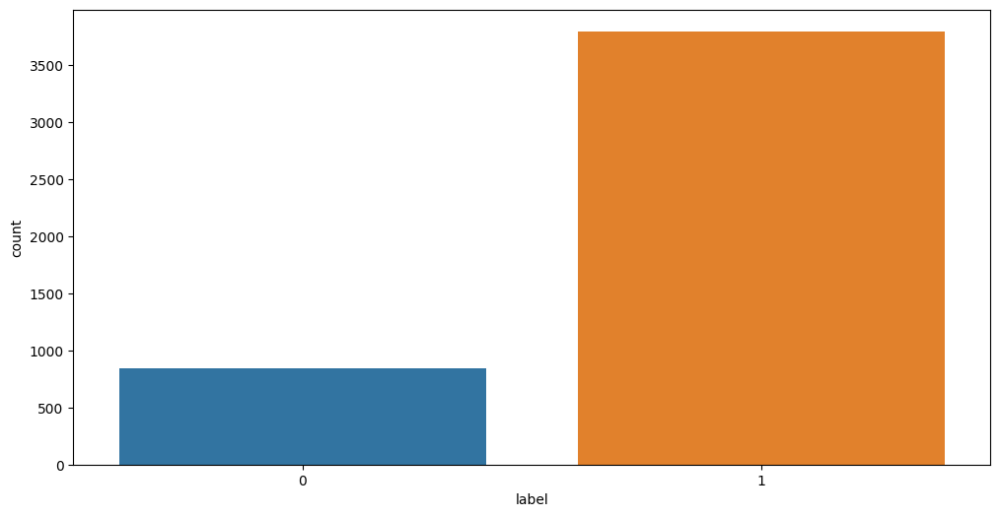

In [ ]:
plt.figure(figsize = (12, 6))
sns.countplot(x = 'label', data = data)

Berdasarkan hasil `value_counts()` dan visualisasi di atas, terlihat bahwa data hoax kini berjumlah 3795 dan data bukan hoax berjumlah 841.

## Split Train-Test

Sebelum melakukan pemodelan, data akan dipisah menjadi data *train* dan *test* dengan ukuran perbandingan 80:20

In [ ]:
from sklearn.model_selection import train_test_split
seed_val = 42

In [ ]:
df1 = data[['judul_clean','label']]

data_train, data_test = train_test_split(df1, test_size = 0.2,
                                         stratify = df1['label'], random_state = seed_val)

## Choosing model

In [ ]:
#Libraries for general purpose
import pandas as pd
import numpy as np

#Data preprocessing
from sklearn.model_selection import train_test_split

# Feature Extraction
from sklearn.feature_extraction.text import CountVectorizer
#from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer


# Classifier: NB, LR, DT, RF, SVC
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

# Metric
from sklearn.metrics import classification_report, accuracy_score, f1_score

from tqdm import tqdm

#Seed for reproducibility
import random

seed_value = 42
random.seed(seed_value)
np.random.seed(seed_value)

### Model classifier function

Bentuk fungsi untuk menghitung akurasi dan f1-score terhadap model

In [ ]:
score_f1_acc = pd.DataFrame(np.zeros(shape=(7,3)), columns=['model', 'F1 Score', 'Accuracy'])
pred_df = pd.DataFrame()

def model_clf(clf, loc, model_name):
    #clf.fit(X_train, y_train.tolist())
    clf.fit(X_train, y_train)
    acc_train = clf.score(X_train, y_train)

    predictions = clf.predict(X_test)
    acc_test = accuracy_score(y_test, predictions)
    f_one = f1_score(y_test, predictions, average = 'micro')

    print(pd.crosstab(y_test, predictions, rownames=['Actual'], colnames=['Predicted']))
    print()
    print(classification_report(y_test, predictions))
    print('Accuracy X_train: {:.2f}'.format(round(acc_train*100, 2)))
    print('Accuracy X_test: {:.2f}'.format(round(acc_test*100, 2)))
    print('F1 Score: {:.2f}'.format(round(f_one*100, 2)))
    #print(round(f_one*100, 2), round(acc_test*100, 2))
    score_f1_acc.loc[loc] = [model_name, round(f_one*100, 2), round(acc_test*100, 2)]

    #predictions_val = clf.predict(X_val)
    #pred_val = pd.DataFrame(predictions_val, columns = ['label_{}'.format(model_name)])
    #pred_df['label_{}'.format(model_name)] = pred_val
    #print(predictions_val)

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

### 1. Bag of Words (BoW) as Feature

Model pertama yang akan dibentuk adalah dengan feature Bag of Words (BoW) menggunakan `CountVectorizer()`

In [ ]:
X = data["judul_clean"].values
y = data["label"].values

X_train_pre, X_test_pre, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=seed_value)

count_vectorizer = CountVectorizer()

X_train = count_vectorizer.fit_transform(X_train_pre)
X_test  = count_vectorizer.transform(X_test_pre)

#### Naive-Bayes

In [ ]:
clf = MultinomialNB()
#clf = GaussianNB()
model_clf(clf, 0, 'NB-BoW')

Predicted   0    1
Actual            
0          39  138
1          31  720

              precision    recall  f1-score   support

           0       0.56      0.22      0.32       177
           1       0.84      0.96      0.89       751

    accuracy                           0.82       928
   macro avg       0.70      0.59      0.61       928
weighted avg       0.79      0.82      0.78       928

Accuracy X_train: 93.58
Accuracy X_test: 81.79
F1 Score: 81.79


#### SVC

In [ ]:
clf = SVC()
#clf = SVC(kernel ='linear', C = 1)
model_clf(clf, 1, 'SVM-BoW')

Predicted   0    1
Actual            
0          43  134
1           8  743

              precision    recall  f1-score   support

           0       0.84      0.24      0.38       177
           1       0.85      0.99      0.91       751

    accuracy                           0.85       928
   macro avg       0.85      0.62      0.64       928
weighted avg       0.85      0.85      0.81       928

Accuracy X_train: 93.47
Accuracy X_test: 84.70
F1 Score: 84.70


#### Logistic Regression

In [ ]:
clf = LogisticRegression(solver='lbfgs', max_iter=1000)
model_clf(clf, 2, 'LR-BoW')

Predicted   0    1
Actual            
0          50  127
1          23  728

              precision    recall  f1-score   support

           0       0.68      0.28      0.40       177
           1       0.85      0.97      0.91       751

    accuracy                           0.84       928
   macro avg       0.77      0.63      0.65       928
weighted avg       0.82      0.84      0.81       928

Accuracy X_train: 95.95
Accuracy X_test: 83.84
F1 Score: 83.84


#### Decision Tree

In [ ]:
clf = DecisionTreeClassifier(criterion='entropy')
model_clf(clf, 3, 'DT-BoW')

Predicted   0    1
Actual            
0          62  115
1          68  683

              precision    recall  f1-score   support

           0       0.48      0.35      0.40       177
           1       0.86      0.91      0.88       751

    accuracy                           0.80       928
   macro avg       0.67      0.63      0.64       928
weighted avg       0.78      0.80      0.79       928

Accuracy X_train: 100.00
Accuracy X_test: 80.28
F1 Score: 80.28


### 2. TFIDF Vectorizer as Feature

Model kedua yang akan dibentuk adalah dengan feature TFIDF Vectorizer menggunakan `TfidfVectorizer()`

In [ ]:
X = data["judul_clean"].values
y = data["label"].values

X_train_pre, X_test_pre, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=seed_value)

tfidf_vectorizer = TfidfVectorizer()

X_train = tfidf_vectorizer.fit_transform(X_train_pre)
X_test  = tfidf_vectorizer.transform(X_test_pre)

#### Naive-Bayes

In [ ]:
clf = MultinomialNB()
#clf = GaussianNB()
model_clf(clf, 4, 'NB-TfIdf')

Predicted  0    1
Actual           
0          0  177
1          1  750

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       177
           1       0.81      1.00      0.89       751

    accuracy                           0.81       928
   macro avg       0.40      0.50      0.45       928
weighted avg       0.65      0.81      0.72       928

Accuracy X_train: 83.17
Accuracy X_test: 80.82
F1 Score: 80.82


#### SVC

In [ ]:
clf = SVC()
model_clf(clf, 5, 'SVM-TfIdf')

Predicted   0    1
Actual            
0          35  142
1           7  744

              precision    recall  f1-score   support

           0       0.83      0.20      0.32       177
           1       0.84      0.99      0.91       751

    accuracy                           0.84       928
   macro avg       0.84      0.59      0.61       928
weighted avg       0.84      0.84      0.80       928

Accuracy X_train: 94.47
Accuracy X_test: 83.94
F1 Score: 83.94


#### Logistic Regression

In [ ]:
clf = LogisticRegression(solver='lbfgs', max_iter=1000)
model_clf(clf, 6, 'LR-TfIdf')

Predicted   0    1
Actual            
0          27  150
1           5  746

              precision    recall  f1-score   support

           0       0.84      0.15      0.26       177
           1       0.83      0.99      0.91       751

    accuracy                           0.83       928
   macro avg       0.84      0.57      0.58       928
weighted avg       0.83      0.83      0.78       928

Accuracy X_train: 85.46
Accuracy X_test: 83.30
F1 Score: 83.30


#### Decision Tree

In [ ]:
clf = DecisionTreeClassifier(criterion='entropy')
model_clf(clf, 7, 'DT-TfIdf')

Predicted   0    1
Actual            
0          64  113
1          87  664

              precision    recall  f1-score   support

           0       0.42      0.36      0.39       177
           1       0.85      0.88      0.87       751

    accuracy                           0.78       928
   macro avg       0.64      0.62      0.63       928
weighted avg       0.77      0.78      0.78       928

Accuracy X_train: 100.00
Accuracy X_test: 78.45
F1 Score: 78.45


### Summary

In [ ]:
#print all scores
score_f1_acc

,model,F1 Score,Accuracy
0,NB-BoW,81.79,81.79
1,SVM-BoW,84.70,84.70
2,LR-BoW,83.84,83.84
3,DT-BoW,80.28,80.28
4,NB-TfIdf,80.82,80.82
5,SVM-TfIdf,83.94,83.94
6,LR-TfIdf,83.30,83.30
7,DT-TfIdf,78.45,78.45


### Cross Validation

Setelah dibentuk model-modelnya, akan dilanjukan dengan cross-validation

In [ ]:
from sklearn.model_selection import cross_val_score, RandomizedSearchCV, GridSearchCV
from sklearn.pipeline import make_pipeline
from sklearn import neighbors
from sklearn import svm
from sklearn.neural_network import MLPClassifier

#### GridSearch SVM-BoW

In [ ]:
parameters = {'kernel': ('linear', 'rbf'), 'C': (1,4,8,16,32)}

svc = svm.SVC()
clf = GridSearchCV(svc, parameters, cv=10, n_jobs=-1) ## `-1` run in parallel
clf.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=SVC(), n_jobs=-1,
             param_grid={'C': (1, 4, 8, 16, 32), 'kernel': ('linear', 'rbf')})

In [ ]:
#print(sorted(clf.cv_results_.keys()))
print(clf.best_params_)

{'C': 1, 'kernel': 'linear'}


In [ ]:
print(clf.score(X_test, y_test))

0.8577586206896551


#### GridSearch kNN-TFIDF

In [ ]:
# Optimal parameter k-NN dengan GRIDSEARCH
# https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html

X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.2, random_state = seed_val)
# Perhatikan kita pakai data awal : Text karena kita akan optimalkan preprocessing juga

kCV = 5
metric = 'accuracy'
params = {}
params['tfidfvectorizer__min_df'] = [5, 10, 15]
params['tfidfvectorizer__max_df'] = [0.5, 0.75, 0.95]
params['tfidfvectorizer__smooth_idf'] = [True] # [True, False]
params['tfidfvectorizer__sublinear_tf'] = [True] # [True, False]
params['tfidfvectorizer__ngram_range'] = [(1, 1), (1, 2), (1,3)]
params['kneighborsclassifier__n_neighbors'] = [3, 5, 10]
params['kneighborsclassifier__weights'] = ('distance', 'uniform')

pipe = make_pipeline(TfidfVectorizer(), neighbors.KNeighborsClassifier())
gridCV = GridSearchCV(pipe, params, cv=kCV, scoring=metric, verbose=1, n_jobs=-1) # , pre_dispatch='2*n_jobs', pre_dispatch min 2* n_jobs
gridCV.fit(X_train, y_train)
print(gridCV.best_score_)
print(gridCV.best_params_)

Fitting 5 folds for each of 162 candidates, totalling 810 fits
0.8314469046345907
{'kneighborsclassifier__n_neighbors': 10, 'kneighborsclassifier__weights': 'uniform', 'tfidfvectorizer__max_df': 0.5, 'tfidfvectorizer__min_df': 15, 'tfidfvectorizer__ngram_range': (1, 1), 'tfidfvectorizer__smooth_idf': True, 'tfidfvectorizer__sublinear_tf': True}


#### RandomSearch SVM-TFIDF

In [ ]:
# Optimal parameter SVM dengan RandomSEARCH
# https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html

pipeSVM = make_pipeline(TfidfVectorizer(), svm.SVC())
print(sorted(pipeSVM.get_params().keys()))

['memory', 'steps', 'svc', 'svc__C', 'svc__break_ties', 'svc__cache_size', 'svc__class_weight', 'svc__coef0', 'svc__decision_function_shape', 'svc__degree', 'svc__gamma', 'svc__kernel', 'svc__max_iter', 'svc__probability', 'svc__random_state', 'svc__shrinking', 'svc__tol', 'svc__verbose', 'tfidfvectorizer', 'tfidfvectorizer__analyzer', 'tfidfvectorizer__binary', 'tfidfvectorizer__decode_error', 'tfidfvectorizer__dtype', 'tfidfvectorizer__encoding', 'tfidfvectorizer__input', 'tfidfvectorizer__lowercase', 'tfidfvectorizer__max_df', 'tfidfvectorizer__max_features', 'tfidfvectorizer__min_df', 'tfidfvectorizer__ngram_range', 'tfidfvectorizer__norm', 'tfidfvectorizer__preprocessor', 'tfidfvectorizer__smooth_idf', 'tfidfvectorizer__stop_words', 'tfidfvectorizer__strip_accents', 'tfidfvectorizer__sublinear_tf', 'tfidfvectorizer__token_pattern', 'tfidfvectorizer__tokenizer', 'tfidfvectorizer__use_idf', 'tfidfvectorizer__vocabulary', 'verbose']


In [ ]:
# Optimal parameter SVM dengan RandomizedSearch

paramsSVM = {}
paramsSVM['tfidfvectorizer__min_df'] = [5, 10, 30]
paramsSVM['tfidfvectorizer__max_df'] = [0.5, 0.75, 0.95]
paramsSVM['tfidfvectorizer__smooth_idf'] = [True] # [True, False]
paramsSVM['tfidfvectorizer__sublinear_tf'] = [True] # [True, False]
paramsSVM['tfidfvectorizer__ngram_range'] = [(1, 1), (1, 2), (1,3)]
paramsSVM['svc__C'] = [0.1, 10, 100] #sp.stats.uniform(scale=1)
paramsSVM['svc__gamma'] = [1.0, 0.1, 0.001]
paramsSVM['svc__kernel'] = ['rbf', 'poly', 'sigmoid', 'linear']
paramsSVM['svc__decision_function_shape'] = ['ovo', 'ovr']

randsvmCV = RandomizedSearchCV(pipeSVM, paramsSVM, cv=kCV, scoring=metric, verbose=1, n_iter=30, random_state=seed_val, n_jobs=-1) # , pre_dispatch='2*n_jobs' pre_dispatch min 2* n_jobs
randsvmCV.fit(X_train, y_train)
print(randsvmCV.best_score_)
print(randsvmCV.best_params_)

Fitting 5 folds for each of 30 candidates, totalling 150 fits
0.8570602849649523
{'tfidfvectorizer__sublinear_tf': True, 'tfidfvectorizer__smooth_idf': True, 'tfidfvectorizer__ngram_range': (1, 1), 'tfidfvectorizer__min_df': 30, 'tfidfvectorizer__max_df': 0.75, 'svc__kernel': 'linear', 'svc__gamma': 0.001, 'svc__decision_function_shape': 'ovo', 'svc__C': 100}


#### RandomSearch ANN-TFIDF

In [ ]:
# Optimal parameter ANN dengan RandomSEARCH
# https://scikit-learn.org/stable/modules/generated/sklearn.neural_network.MLPClassifier.html

pipeNN = make_pipeline(TfidfVectorizer(), MLPClassifier())
print(sorted(pipeNN.get_params().keys()))

['memory', 'mlpclassifier', 'mlpclassifier__activation', 'mlpclassifier__alpha', 'mlpclassifier__batch_size', 'mlpclassifier__beta_1', 'mlpclassifier__beta_2', 'mlpclassifier__early_stopping', 'mlpclassifier__epsilon', 'mlpclassifier__hidden_layer_sizes', 'mlpclassifier__learning_rate', 'mlpclassifier__learning_rate_init', 'mlpclassifier__max_fun', 'mlpclassifier__max_iter', 'mlpclassifier__momentum', 'mlpclassifier__n_iter_no_change', 'mlpclassifier__nesterovs_momentum', 'mlpclassifier__power_t', 'mlpclassifier__random_state', 'mlpclassifier__shuffle', 'mlpclassifier__solver', 'mlpclassifier__tol', 'mlpclassifier__validation_fraction', 'mlpclassifier__verbose', 'mlpclassifier__warm_start', 'steps', 'tfidfvectorizer', 'tfidfvectorizer__analyzer', 'tfidfvectorizer__binary', 'tfidfvectorizer__decode_error', 'tfidfvectorizer__dtype', 'tfidfvectorizer__encoding', 'tfidfvectorizer__input', 'tfidfvectorizer__lowercase', 'tfidfvectorizer__max_df', 'tfidfvectorizer__max_features', 'tfidfvector

In [ ]:
paramsNN = {}
paramsNN['tfidfvectorizer__min_df'] = [5, 10, 30]
paramsNN['tfidfvectorizer__max_df'] = [0.5, 0.75, 0.95]
paramsNN['tfidfvectorizer__smooth_idf'] = [True] # [True, False]
paramsNN['tfidfvectorizer__sublinear_tf'] = [True] # [True, False]
paramsNN['tfidfvectorizer__ngram_range'] = [(1, 1), (1, 2), (1,3)]
paramsNN['mlpclassifier__hidden_layer_sizes'] = [(5,10), (20,30), (30,50)]
paramsNN['mlpclassifier__learning_rate'] = ['constant', 'invscaling', 'adaptive']
paramsNN['mlpclassifier__activation'] = ['logistic', 'tanh', 'relu' ]

randNnCV = RandomizedSearchCV(pipeNN, paramsNN, cv=kCV, scoring=metric, verbose=1, n_iter=30, random_state=seed_val, n_jobs=-1) # , pre_dispatch='2*n_jobs' pre_dispatch min 2* n_jobs
randNnCV.fit(X_train, y_train)
print(randNnCV.best_score_)
print(randNnCV.best_params_)

Fitting 5 folds for each of 30 candidates, totalling 150 fits
0.8503210129823835
{'tfidfvectorizer__sublinear_tf': True, 'tfidfvectorizer__smooth_idf': True, 'tfidfvectorizer__ngram_range': (1, 1), 'tfidfvectorizer__min_df': 30, 'tfidfvectorizer__max_df': 0.95, 'mlpclassifier__learning_rate': 'adaptive', 'mlpclassifier__hidden_layer_sizes': (30, 50), 'mlpclassifier__activation': 'tanh'}


In [ ]:
knn_score = gridCV.cv_results_['mean_test_score'][:10]
svm_score = randsvmCV.cv_results_['mean_test_score'][:10]
ann_score = randNnCV.cv_results_['mean_test_score'][:10]
ann_score

array([0.74730113, 0.82065359, 0.80582116, 0.80636024, 0.77427313,
       0.80555271, 0.81149063, 0.79342151, 0.84951348, 0.74622332])

Accuracy kNN: 0.71 (+/- 0.07)
Accuracy SVM: 0.83 (+/- 0.06)
Accuracy NN: 0.80 (+/- 0.06)


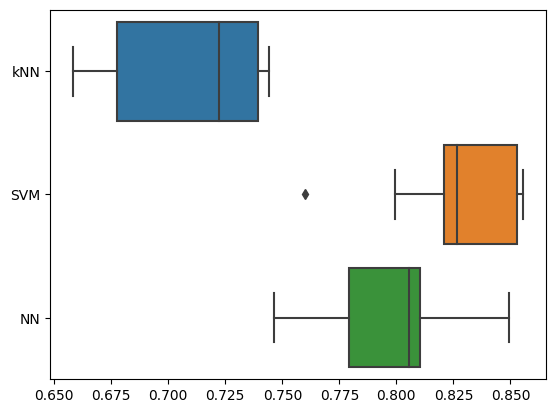

In [ ]:
import seaborn as sns, matplotlib.pyplot as plt

models = ['kNN', 'SVM', 'NN']
scores = [knn_score, svm_score, ann_score]

model_score = {m:s for m,s in zip(models, scores)}
for name in model_score.keys():
    print("Accuracy %s: %0.2f (+/- %0.2f)" % (name, model_score[name].mean(), model_score[name].std() * 2))

sns.boxplot(data=pd.DataFrame(model_score), orient='h')
plt.show()

Terlihat bahwa model SVM memiliki akurasi yang lebih tinggi dibandingkan NN ataupun kNN.

Sehingga, model yang kami pilih sebagai model terbaik adalah model SVM dengan ekstraksi fitur TFIDF/BoW menggunakan cross-validation GridSearch. Model terbaik tersebut memiliki akurasi sebesar 85.7%

### Analysis

Setelah didapatkan model terbaik, akan dilanjutkan dengan melakukan analisis lanjutan

In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=2df2015ba741bf197c04b538d4532ac836f4df720d1bc666f588587427914d87
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
import lime
from lime.lime_text import LimeTextExplainer
from sklearn.pipeline import Pipeline


In [ ]:
tfidf_vec = TfidfVectorizer(min_df = 10, token_pattern = r'[a-zA-Z]+')

In [ ]:
## Refit model based on optimal parameter settings
pipeline = Pipeline([
  ('vectorizer',tfidf_vec),
  ('clf', svm.SVC(C=1, kernel='linear', probability=True))])
pipeline.fit(X_train, y_train)

Pipeline(steps=[('vectorizer',
                 TfidfVectorizer(min_df=10, token_pattern='[a-zA-Z]+')),
                ('clf', SVC(C=1, kernel='linear', probability=True))])

In [ ]:
import textwrap
reviews_test = X_test_pre
hoax_test = y_test

# We choose a sample from test set
idx = 450
text_sample = reviews_test[idx]
class_names = ['bukan hoax', 'hoax']

print('Review ID-{}:'.format(idx))
print('-'*50)
print('Review Text:\n', textwrap.fill(text_sample,400))
print('-'*50)
print('Probability(hoax) =', pipeline.predict_proba([text_sample])[0,1])
print('Probability(not hoax) =', pipeline.predict_proba([text_sample])[0,0])
print('Predicted class: %s' % pipeline.predict([text_sample]))
print('True class: %s' % hoax_test[idx])

Review ID-450:
--------------------------------------------------
Review Text:
 klarifikasi dahnil anzar terkait mail skenario coklat1
--------------------------------------------------
Probability(hoax) = 0.0039950691978780355
Probability(not hoax) = 0.9960049308021222
Predicted class: [0]
True class: 0


In [ ]:
import matplotlib
matplotlib.rcParams['figure.dpi']=300
%matplotlib inline

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample,
                                         pipeline.predict_proba,
                                         num_features=20)
explanation.show_in_notebook(text=True)

In [ ]:
## Extract the coefficients of the model from the pipeline
importances = pipeline.named_steps['clf'].coef_.toarray().flatten()
## Select top 10 positive/negative weights
top_indices_hoax = np.argsort(importances)[::-1][:10]
top_indices_not = np.argsort(importances)[:10]
## Get featnames from tfidfvectorizer
feature_names = np.array(tfidf_vec.get_feature_names_out()) # List indexing is different from array

In [ ]:
feature_importance_df = pd.DataFrame({'FEATURE': feature_names[np.concatenate((top_indices_hoax, top_indices_not))],
                                     'IMPORTANCE': importances[np.concatenate((top_indices_hoax, top_indices_not))],
                                     'SENTIMENT': ['hoax' for _ in range(len(top_indices_hoax))]+['bukan hoax' for _ in range(len(top_indices_not))]})
feature_importance_df

,FEATURE,IMPORTANCE,SENTIMENT
0,info,1.238387,hoax
1,adalah,0.942855,hoax
2,bebas,0.889100,hoax
3,atas,0.864872,hoax
4,psi,0.724816,hoax
5,minggu,0.698114,hoax
6,kartu,0.655765,hoax
7,ingin,0.635247,hoax
8,minuman,0.615931,hoax
9,judul,0.608598,hoax


Text(0.5, 1.0, 'Feature Importance: Top Words')

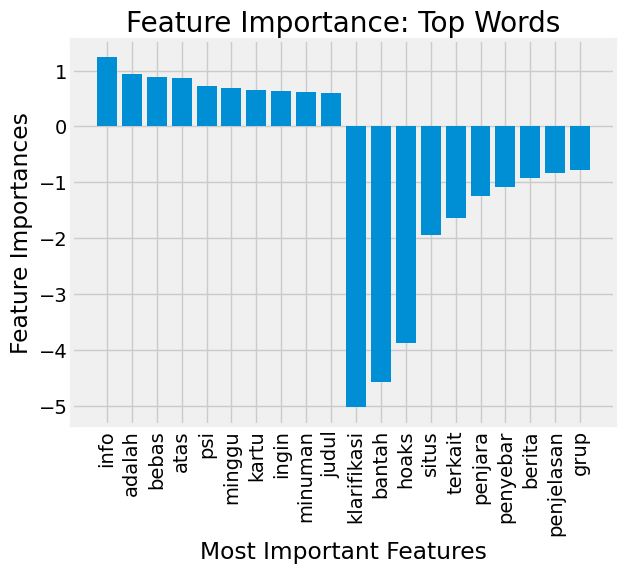

In [ ]:
plt.figure(figsize=(7,5), dpi=100)
plt.style.use('fivethirtyeight')
#print(plt.style.available)
plt.bar(x = feature_importance_df['FEATURE'], height=feature_importance_df['IMPORTANCE'])
plt.xlabel("Most Important Features")
plt.ylabel("Feature Importances")
plt.xticks(rotation=90)
plt.title("Feature Importance: Top Words", color="black")

*Feature importance* mengacu pada teknik yang menghitung skor untuk semua input fitur untuk model tertentu. Skor tersebut mewakili "pentingnya" setiap fitur. Skor yang lebih tinggi berarti fitur spesifik akan mempunyai pengaruh yang lebih besar pada model yang digunakan untuk memprediksi variabel tertentu.

Maka, berdasarkan analisis *feature importance* di atas, kata dengan *importance* yang lebih besar memiliki pengaruh yang lebih besar pada model.

## Alasan pemilihan model

Dalam upaya mengidentifikasi informasi palsu (hoax), kami melakukan analisis pengaruh variabel "judul" yang berhubungan dengan isi atau narasi dalam berita. Kami memilih variabel "judul" karena dalam banyak kasus, judul suatu berita umumnya sudah memberikan representasi yang cukup baik mengenai apa yang akan dibahas dalam isi atau narasinya.

Ada situasi di mana suatu berita berisi narasi yang sangat panjang dan terdapat banyak kata kunci yang kurang spesifik atau tidak lagi merujuk secara langsung pada inti dari berita tersebut. Dalam kasus sedemikian, penggunaan judul berperan penting sebagai alternatif yang efisien untuk mengetahui intisari dari suatu berita. Oleh karena itu, bagi sebagian orang, membaca judul saja sudah bisa memberikan gambaran umum tentang topik atau pokok pikiran dari berita tersebut.

Analisis ini dilatar belakangi oleh kecenderungan masyarakat Indonesia yang rentan terpengaruh oleh judul atau headline pada suatu berita tanpa membaca narasinya terlebih dahulu. Pertimbangan lainnya yaitu itu terkait dimensi data (matrix hasil bow / tfidf) yang menjadi lebih kecil. Apabila menggunakan judul dan narasi sekaligus, dimensi akan menjadi lebih besar dan perlu dipotong untuk mereduksinya agar dapat menyesuaikan model dengan keperluan yang dibutuhkan.

## INSIGHT

Dikutip dari Beritasatu.com, berdasarkan survei Katadata Insight Center (KIC) yang bekerjasama dengan Kementerian Komunikasi dan Informatika serta SiBerkreasi, setidaknya 30% sampai hampir 60% orang Indonesia terpapar hoaks saat mengakses dan berkomunikasi melalui dunia maya. Sementara hanya 21% sampai 36% saja yang mampu mengenali hoax. Kebanyakan hoax yang ditemukan berkaitan dengan isu politik, kesehatan, dan agama. Hasil tersebut menunjukkan bahwa masih banyak masyarakat Indonesia yang terpengaruh dengan berita hoax. Oleh sebab itu, didirikan organisasi Masyarakat Anti Fitnah Indonesia (MAFINDO) yang merupakan Organisasi Kemasyarakatan dengan tujuan mensosialisasikan bahaya informasi bohong (hoax) dan menciptakan imunitas terhadap hoax di masyarakat Indonesia. MAFINDO berupaya untuk meningkatkan literasi digital di kalangan masyarakat untuk mengidentifikasi dan menghindari penyebaran informasi yang tidak benar.

### Pie Chart

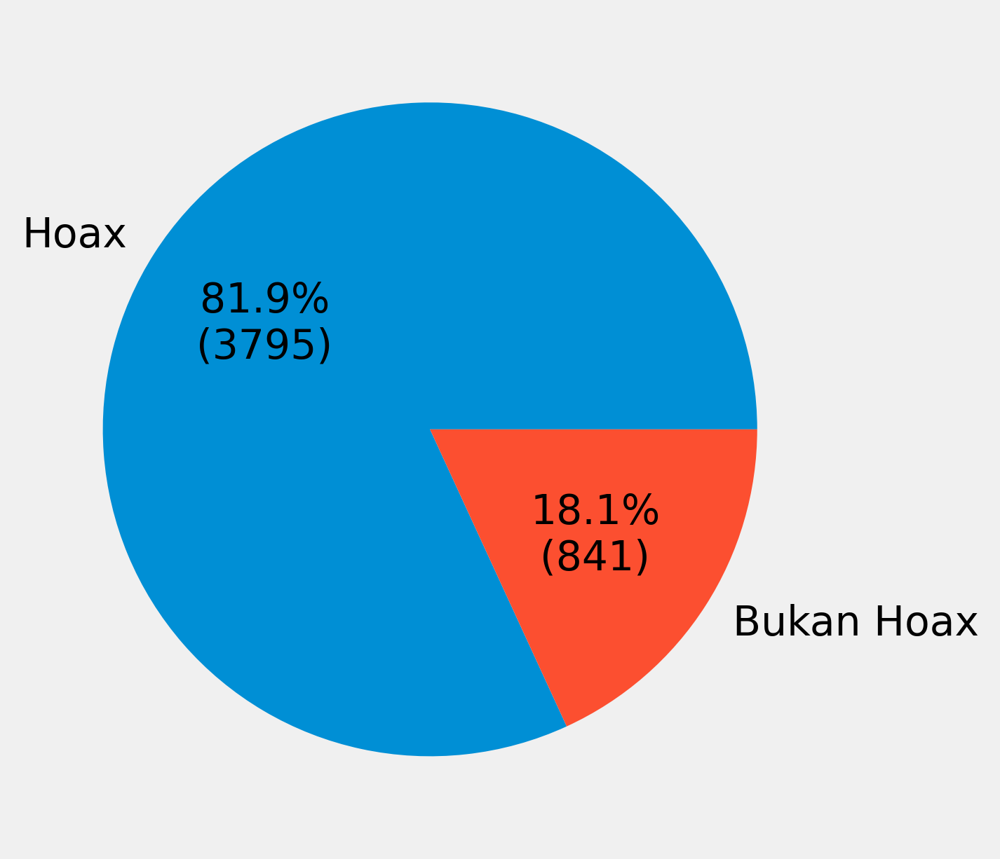

In [ ]:
#https://stackoverflow.com/a/71515035/2901002
def autopct_format(values):
        def my_format(pct):
            total = sum(values)
            val = int(round(pct*total/100.0))
            return '{:.1f}%\n({v:d})'.format(pct, v=val)
        return my_format

s = data['label'].value_counts()
s.index = ['Hoax', 'Bukan Hoax']

plt.pie(s,labels = s.index, autopct=autopct_format(s))
plt.show()

Berdasarkan pie chart di atas, terlihat bahwa dari 4636 konten yang diambil pada situs https://www.mafindo.or.id, terdapat 81.9% konten terindikasi sebagai Hoax. Hal ini menunjukkan konten hoax yang tersebar di Indonesia masih sangat banyak. Mengingat berdasarkan KIC, 30-60% masyarakat Indonesia terpapar hoaks saat mengakses internet, sehingga diperlukan edukasi kepada masyarakat mengenai konten hoaks dan dapat mengenali kata-kata yang mengindikasi suatu konten berupa hoaks. Lebih lanjut, sebaiknya dibuat suatu program untuk mengidentifikasi suatu konten berupa hoaks atau non-hoaks kepada masyarakat sehingga dapat lebih terhindar dari hoaks saat mengakses internet.

### Importance Top Words Plot

![Pytorch logo](https://github.com/yudisdc/DataMining/blob/main/gambar.png?raw=true)

Plot di atas menunjukkan kata-kata yang penting dari sebuah berita, dapat dilihat kata-kata yang mengarah ke bawah (*importance* negatif) merupakan kata-kata yang banyak muncul pada berita non-hoax. Kata *klarifikasi* dan *bantah* paling banyak terdapat di berita-berita non-hoax. Menunjukkan bahwa berita ini muncul untuk mengoreksi konten hoax yang sudah tersebar sebelumnya. Dari hasil di atas, diharapkan masyarakat akan lebih teredukasi dengan kata-kata yang rawan terindikasi hoaks. Sehingga bisa kritis ketika membaca sebuah berita agar dapat terhindar dari konten hoax.  

### Topic Model & Voyant Tools

Memasuki tahun politik, mulai terlihat semakin banyak konten hoaks yang beredar melalui berbagai platform, baik media sosial maupun berita. Dengan membuat Topic Model dan Voyant Tools. Kita ingin melihat isu apa saja yang sedang ramai dibicarakan dan kata apa saja yang biasanya merujuk kepada sebuah hoax.

In [ ]:
import warnings; warnings.simplefilter('ignore')
import nltk

try:
    import google.colab; IN_COLAB = True
    !wget https://raw.githubusercontent.com/taudataanalytics/eLearning/master/taudataNlpTm.py
    !mkdir data
    !wget -P data/ https://raw.githubusercontent.com/taudataanalytics/eLearning/master/data/slang.txt
    !wget -P data/ https://raw.githubusercontent.com/taudataanalytics/eLearning/master/data/stopwords_id.txt
    !wget -P data/ https://raw.githubusercontent.com/taudataanalytics/eLearning/master/data/stopwords_en.txt
    !wget -P data/ https://raw.githubusercontent.com/taudataanalytics/eLearning/master/data/kata_dasar.txt
    !wget -P data/ https://raw.githubusercontent.com/taudataanalytics/eLearning/master/data/wn-ind-def.tab
    !wget -P data/ https://raw.githubusercontent.com/taudataanalytics/eLearning/master/data/wn-msa-all.tab
    !wget -P data/ https://raw.githubusercontent.com/taudataanalytics/eLearning/master/data/ind_SA.csv
    !wget -P data/ https://raw.githubusercontent.com/taudataanalytics/eLearning/master/data/all_indo_man_tag_corpus_model.crf.tagger

    !pip install spacy python-crfsuite unidecode textblob sastrawi
    !python -m spacy download xx
    !python -m spacy download en_core_web_sm

    nltk.download('popular')
except:
    IN_COLAB = False
    print("Running the code locally, please make sure all the python module versions agree with colab environment and all data/assets downloaded")

--2023-11-24 16:31:30--  https://raw.githubusercontent.com/taudataanalytics/eLearning/master/taudataNlpTm.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 14001 (14K) [text/plain]
Saving to: ‘taudataNlpTm.py’

taudataNlpTm.py     100%[===================>]  13.67K  --.-KB/s    in 0s      

2023-11-24 16:31:30 (59.1 MB/s) - ‘taudataNlpTm.py’ saved [14001/14001]

mkdir: cannot create directory ‘data’: File exists
--2023-11-24 16:31:31--  https://raw.githubusercontent.com/taudataanalytics/eLearning/master/data/slang.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent,

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/cmudict.zip.
[nltk_data]    | Downloading package gazetteers to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/gazetteers.zip.
[nltk_data]    | Downloading package genesis to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/genesis.zip.
[nltk_data]    | Downloading package gutenberg to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/gutenberg.zip.
[nltk_data]    | Downloading package inaugural to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/inaugural.zip.
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping corpora/movie_reviews.zip.
[nltk_data]    | Downloading package names to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/names.zip.
[nltk_data]    | Downloading package shakespeare to /root/nltk_data...
[nlt

#### Topic Model

In [ ]:
# Install dan import modul topicwizard untuk topic modelling
!pip install topic-wizard
import topicwizard

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.5/108.5 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 62.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 103.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 76.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 500.8/500.8 kB 46.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 298.0/298.0 kB 35.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.9/90.9 kB 13.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.4/90.4 kB 11.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 5.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.2/54.2 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━

In [ ]:
topic = [doc for doc in data.judul_clean]

In [ ]:
#Hilangkan stopwords
import taudataNlpTm as tau
from tqdm import tqdm

stops, lemmatizer = tau.LoadStopWords(lang='id')
for i,d in tqdm(enumerate(topic)):
    topic[i] = tau.cleanText(d, lemma=lemmatizer, stops = stops, symbols_remove = True, min_charLen = 2)
corpus = topic
corpus[1:5]

4636it [10:17,  7.51it/s]


['instruksi gubernur jawa tilang masker muka rupiah tilang via apps pikobar',
 'foto jim rohn jokowi presiden baik sejarah bangsa indonesia',
 'politik nyata jokowi hasil pulang triliun uang negara swiss',
 'foto kadrun lihat foto panas dingin']

In [ ]:
from sklearn.decomposition import NMF
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.pipeline import Pipeline
vectorizer = CountVectorizer(min_df=10, max_df=0.5)
topic_model = NMF(n_components=10)
# Then we set up a pipeline
topic_pipeline = Pipeline(
    [
        ("vectorizer", vectorizer),
        ("topic_model", topic_model),
    ]
)

topic_pipeline.fit(corpus)

Pipeline(steps=[('vectorizer', CountVectorizer(max_df=0.5, min_df=10)),
                ('topic_model', NMF(n_components=10))])

In [ ]:
#Perlu run ulang agar bisa muncul
#Proses membutuhkan waktu sedikit lama
topicwizard.visualize(pipeline=topic_pipeline, corpus=corpus)

Preprocessing


<IPython.core.display.Javascript object>

Open in browser:


<IPython.core.display.Javascript object>

<Thread(Thread-22 (_run_silent), stopped 132352294499904)>

Contoh Hasil Running

![Pytorch logo](https://github.com/yudisdc/DataMining/blob/main/gambar1.png?raw=true)

Dari topic modelling, 10 topik yang sedang ramai dan rawan hoaks adalah \\
0_partai_komunis_indonesia_nasional \\
1_Jokowi_dukung_maruf_berita \\
2_corona_virus_orang_covid \\
3_anak_foto_jalan_korban \\
4_polisi_kepala_republik_hoaks \\
5_covid_of_anak_video \\
6_daerah_khusus_ibukota_jakarta \\
7_cina_kerja_asing_tenaga \\
8_presiden_pilih_wakil_prabowo \\
9_kait_klarifikasi_negeri_menteri \\

Dari topik-topik di atas, dapat dilihat bahwa isu yang ada saat ini didominasi oleh isu politik, tenaga kerja asing, dan juga mengenai COVID-19



#### Voyant Tools

Dengan menggunakan Voyant Tools, akan digunakan data hoaks yang berasal dari situs https://www.mafindo.or.id untuk melihat seberapa sering sebuah kata muncul dalam data berlabel 1 (hoaks).

In [ ]:
# Merubah bentuk data
J = [doc for doc in data.judul_clean]
N = [doc for doc in data.narasi_clean]
Y = data.label
'Done'

'Done'

In [ ]:
import taudataNlpTm as tau
from tqdm import tqdm

stops, lemmatizer = tau.LoadStopWords(lang='en')
henti, lemmatizerid = tau.LoadStopWords(lang = "id")
for i,b in tqdm(enumerate(J)):
    J[i] = tau.cleanText(b, lemma=lemmatizer, stops = stops, symbols_remove = True, min_charLen = 2)
    J[i] = tau.cleanText(b, lemma=lemmatizerid, stops = henti, symbols_remove = True, min_charLen = 2)
print(J[0])

for i,b in tqdm(enumerate(N)):
    N[i] = tau.cleanText(b, lemma=lemmatizer, stops = stops, symbols_remove = True, min_charLen = 2)
    N[i] = tau.cleanText(b, lemma=lemmatizerid, stops = henti, symbols_remove = True, min_charLen = 2)
print(N[0])

4636it [00:02, 1965.01it/s]


pakai masker sakit legionnaires


4636it [08:44,  8.85it/s]

caller to radio talk show recently shared that his istri was hospitalized told she had covid only couple of days left to live doctor friend suggested she be tested for legionnaires disease she wore the mask every day all day long turns out it was legionnaires disease from the moisture bacteria in her mask she was given antibiotics within days was better if these spikes in covid are really something else due to mask induced infections


In [ ]:
# import texts new to dataframe
data['judul_voy'] = J
data['narasi_voy'] = N
forvoyant=data[['label','judul_voy','narasi_voy']].copy()
display(forvoyant.head(5), forvoyant.tail(5))

,label,judul_voy,narasi_voy
0,1,pakai masker sakit legionnaires,caller to radio talk show recently shared that...
1,1,instruksi gubernur jawa tilang masker muka rup...,hormat anggota grup sesuai instruksi gubernur ...
2,1,foto jim rohn jokowi presiden sejarah bangsa i...,jokowi presiden sejarah bangsa indonesia jim r...
3,1,politik nyata jokowi hasil pulang triliun uang...,maaf mas mas mbak mbak politik nyata jokowi ha...
4,1,foto kadrun lihat foto panas dingin,kadrun lihat foto panas dingin


,label,judul_voy,narasi_voy
4631,0,baris serba partai demokrasi indonesia juang d...,ratus massa baris serba baris serba kader nu k...
4632,1,erdogan duduk kursi tamu kursi baba vatikan,erdogan vatikan jumpa baba pop vatikan kursi t...
4633,1,imigran cina sengaja bawa virus tuju basmi rakyat,imigran cn sengaja bawa virus sunti anti bodi ...
4634,1,bukti curang jokowi sembako,edar mana viral video tindak komisi pemelihan ...
4635,1,anak sembunyi kolong meja temu presiden joko w...,naluri anak tajam bos datang manusia bau antag...


In [ ]:
#download csv
datahoax=forvoyant[forvoyant['label'] == 1]
datahoax.to_csv("datahoax.csv", encoding ='utf8', index=False)

![PyTorch Logo](https://github.com/raechelt/voyant/blob/main/voyant.png?raw=true)

Berikut merupakan kata-kata yang paling sering muncul dalam konten hoaks, di antaranya:
-	Indonesia (1398 kata)
-	Jokowi (582 kata)
-	Orang (560 kata)
-	Cina (530 kata)
-	Foto (483 kata)

Dapat diindikasikan bahwa topik yang berisikan kata-kata tersebut merupakan topik yang cukup sering dijadikan dan dimasukkan ke dalam sebuah konten hoaks. Sehingga, ada baiknya bagi masyarakat untuk lebih bersikap kritis terhadap konten yang berisikan kata-kata di atas.


#### WordCloud

In [ ]:
from wordcloud import WordCloud
from collections import Counter

##### Fact WordCloud

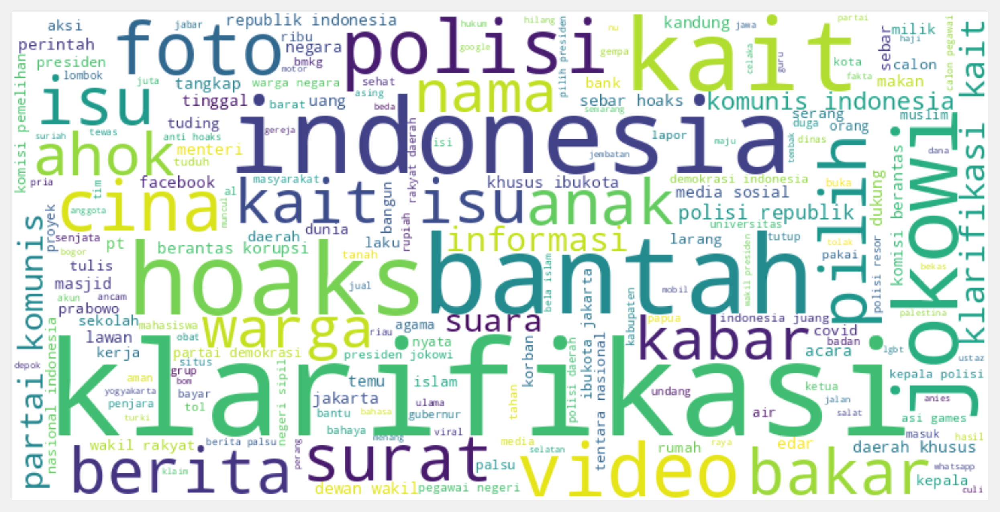

In [ ]:
truth = data[data['label']==0]['judul_voy']
text_data_t = " ".join(truth)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text_data_t)

# Display the generated word cloud using matplotlib
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

##### Hoax WordCloud

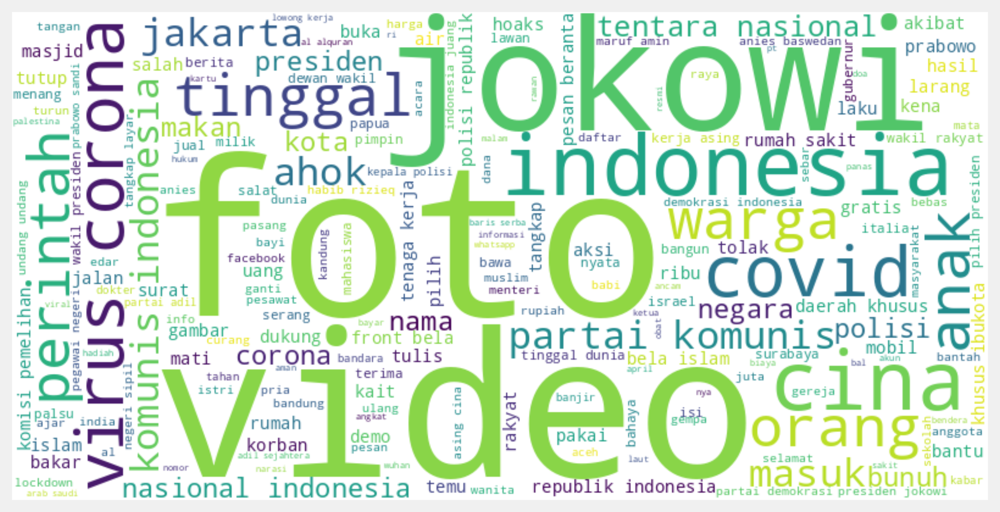

In [ ]:
fake = data[data['label']==1]['judul_voy']
text_data_f = " ".join(fake)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text_data_f)

# Display the generated word cloud using matplotlib
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

##### Distribusi kata bukan hoax

Text(0, 0.5, 'Words')

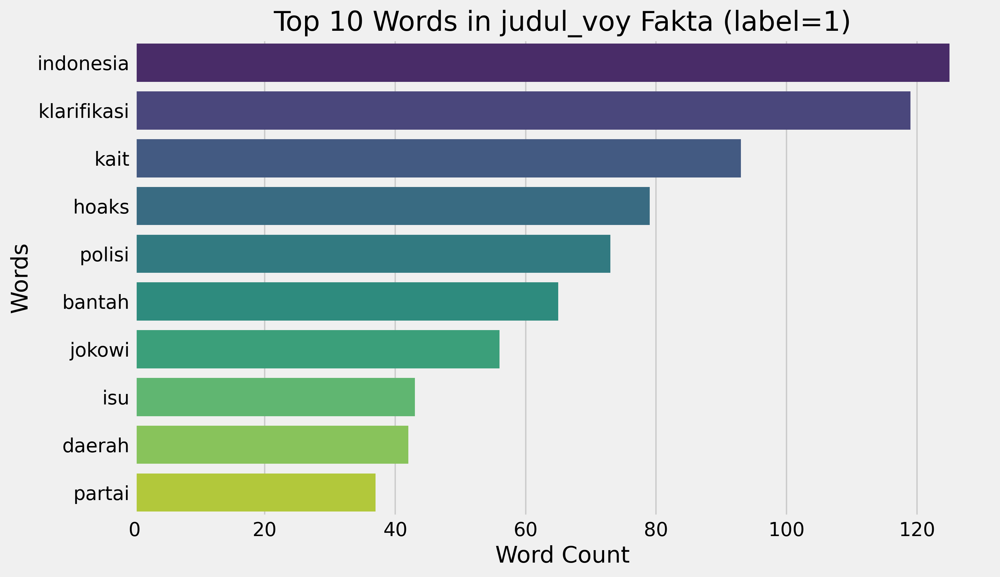

In [ ]:
truth = data[data['label'] == 0]['judul_voy']

# Combine all text data into a single string
text_data = " ".join(truth)

# Tokenize the text into words
words = text_data.split()

# Count the occurrences of each word
word_counts = Counter(words)

# Get the top 10 words
top_words = dict(word_counts.most_common(10))

# Plot the bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x=list(top_words.values()), y=list(top_words.keys()), palette="viridis")
plt.title('Top 10 Words in judul_voy Fakta (label=1)')
plt.xlabel('Word Count')
plt.ylabel('Words')

##### Distribusi kata hoax

Text(0, 0.5, 'Words')

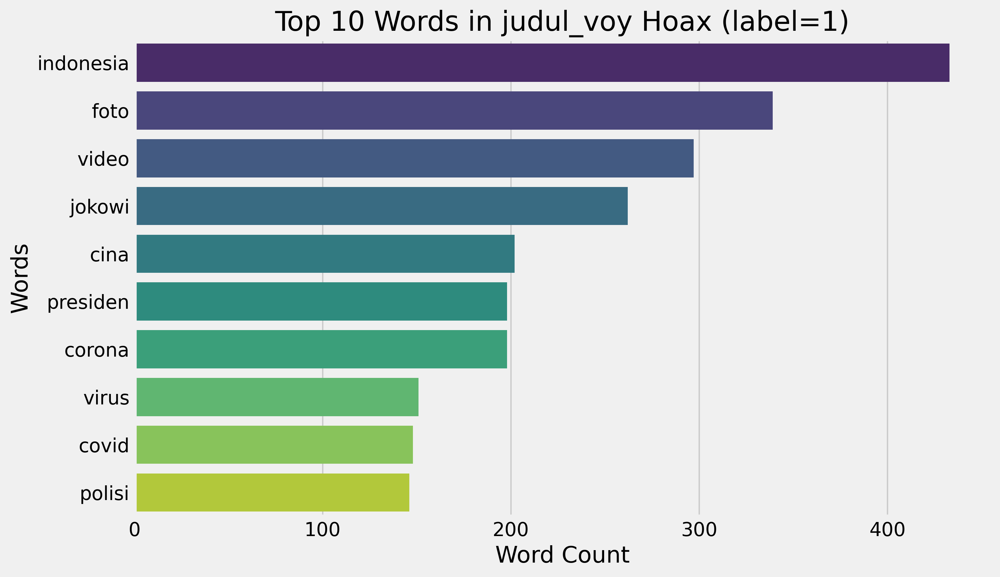

In [ ]:
hoax = data[data['label'] == 1]['judul_voy']

# Combine all text data into a single string
text_data = " ".join(hoax)

# Tokenize the text into words
words = text_data.split()

# Count the occurrences of each word
word_counts = Counter(words)

# Get the top 10 words
top_words = dict(word_counts.most_common(10))

# Plot the bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x=list(top_words.values()), y=list(top_words.keys()), palette="viridis")
plt.title('Top 10 Words in judul_voy Hoax (label=1)')
plt.xlabel('Word Count')
plt.ylabel('Words')


Dalam hasil analisis, terlihat bahwa distribusi kata kunci pada berita yang dapat dikategorikan sebagai "hoax" dan "fakta" memiliki kemiripan yang signifikan. Meskipun demikian, perlu dicatat bahwa pada kategori "fakta" terdapat tren yang menonjol terkait penggunaan kata-kata seperti "klarifikasi" dan "bantah". Kedua kata tersebut umumnya muncul dalam konteks berita yang memberikan penjelasan atau membantah informasi terkait dengan tokoh yang bersangkutan.

Analisis ini dapat mengindikasikan bahwa berita dalam kategori "fakta" cenderung lebih banyak mengandung elemen klarifikasi dan bantahan, menunjukkan kecenderungan untuk memberikan penjelasan dan membantah informasi yang berkaitan dengan tokoh terkait.

## We can expect further: Platform Fact Check

In [ ]:
import textwrap
reviews_test = X_test_pre
hoax_test = y_test

# We choose a sample from test set
idx = 600
text_sample = reviews_test[idx]
class_names = ['bukan hoax', 'hoax']

print('Review ID-{}:'.format(idx))
print('-'*50)
print('Review Text:\n', textwrap.fill(text_sample,400))
print('-'*50)
print('Probability(hoax) =', pipeline.predict_proba([text_sample])[0,1])
print('Probability(not hoax) =', pipeline.predict_proba([text_sample])[0,0])
print('Predicted class: %s' % pipeline.predict([text_sample]))
print('True class: %s' % hoax_test[idx])

Review ID-600:
--------------------------------------------------
Review Text:
 susilo bambang yudhoyono akhirnya mendukung kerja pemerintah jokowi
--------------------------------------------------
Probability(hoax) = 0.8722093869364071
Probability(not hoax) = 0.12779061306359302
Predicted class: [1]
True class: 1


In [ ]:
import matplotlib
matplotlib.rcParams['figure.dpi']=300
%matplotlib inline

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample,
                                         pipeline.predict_proba,
                                         num_features=20)
explanation.show_in_notebook(text=True)

Dengan menggunakan model tersebut, kami mampu memprediksi probabilitas suatu berita dapat dikategorikan sebagai konten hoax atau non-hoax. Model tersebut hanya dapat digunakan pada satu konten saja. Untuk penerapan yang lebih luas, Menteri Kominfo dapat mengembangkan program fungsi dari model tersebut untuk melihat konten-konten yang tersebar pada suatu situs mengandung lebih banyak konten hoax atau non-hoax. Nantinya, program tersebut dapat dibuat menjadi suatu platform "Fact Check" kepada masyarakat agar dapat memilah konten yang mengandung hoax.